<h2 style='text-align:center;font-size:80px;background-color:brown;border:80px;color:white'>   Insurance Claim Fraud Detection Project . <h2>

# Problem Statement:

## Bussiness Case

### Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

### In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made.

### In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not.

# ==================================================

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Reading the csv file from dataset
df = pd.read_csv("Automobile_insurance.csv")
pd.set_option("display.max_columns",None)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


### Dataset have 1000 rows and 40 columns

In [3]:
df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,FEMALE,Associate,sales,kayaking,husband,0,0,26-02-2015,Parked Car,?,Minor Damage,Police,WV,Columbus,1416 Cherokee Ridge,6,1,?,0,3,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [4]:
df.sample(5)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
141,287,41,456604,29-03-2004,IL,500/1000,2000,968.74,0,477519,MALE,Masters,transport-moving,video-games,wife,0,-49000,19-01-2015,Vehicle Theft,?,Trivial Damage,None,SC,Northbrook,5532 Weaver Ridge,9,1,?,2,3,?,5170,470,940,3760,Suburu,Forrestor,2001,N,NaN
432,310,48,439660,11-07-2002,OH,100/300,1000,845.16,0,434342,FEMALE,Masters,priv-house-serv,base-jumping,other-relative,0,0,25-02-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,NC,Northbend,7066 Texas Ave,21,1,YES,1,0,NO,55170,6130,6130,42910,Audi,A5,2005,Y,NaN
710,234,44,442494,06-06-2002,IN,500/1000,500,1780.67,0,465942,MALE,Associate,other-service,exercise,other-relative,0,0,19-02-2015,Single Vehicle Collision,Side Collision,Major Damage,Ambulance,NC,Springfield,6384 5th Ridge,3,1,NO,1,0,NO,70200,7020,7020,56160,Ford,F150,2012,Y,NaN
92,207,42,918629,03-10-2000,IL,250/500,2000,1322.78,0,453277,MALE,PhD,farming-fishing,yachting,own-child,55200,0,28-02-2015,Parked Car,?,Trivial Damage,None,WV,Springfield,5260 Francis Drive,9,1,NO,0,1,NO,5900,590,590,4720,BMW,X5,2007,N,NaN
652,356,54,913337,10-02-2008,OH,500/1000,500,912.30,0,461383,MALE,College,prof-specialty,yachting,wife,58500,-44000,10-01-2015,Multi-vehicle Collision,Front Collision,Major Damage,Other,SC,Northbend,9214 Elm Ridge,23,3,NO,2,1,?,68750,12500,12500,43750,Audi,A5,2007,Y,NaN


#### The dataset contains both categorical and numerical columns. Here "fraud_reported"is our traget column, since it has two categories so it termed to be "Classification Problem"where we need predict if an insurance claim is fraudulent or not.

#### Here i see 0's and ? in the dataset which is needed to be treated also

#### Column _c39 contains NaN values

In [5]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

#### Columns names present in dataset

In [6]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

#### Dataset contains both categorical and numerical columns... Target variable is Object.. categorical columns will be encoded later

<h2 style='text-align:center;font-size:50px;background-color:white;border:50px;color:pink'> EDA <h2>

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

#### This gives info about datset.. column _c39 have all null values and no other columns have null values.. and data types of columns are float64(2), int64(17), object(21)..

# Checking Null Values

In [8]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

#### All columns have 0 null values except _c39 have all null values.. but few columns contains ? which is also considered as null

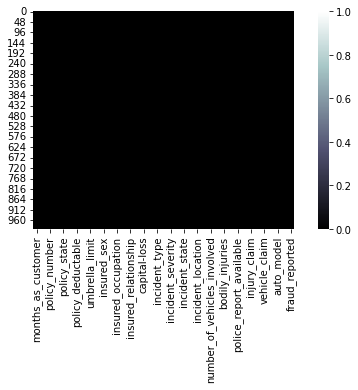

In [9]:
# Let's visualize NaN values
sns.heatmap(df.isnull(),cmap="bone")
plt.show()

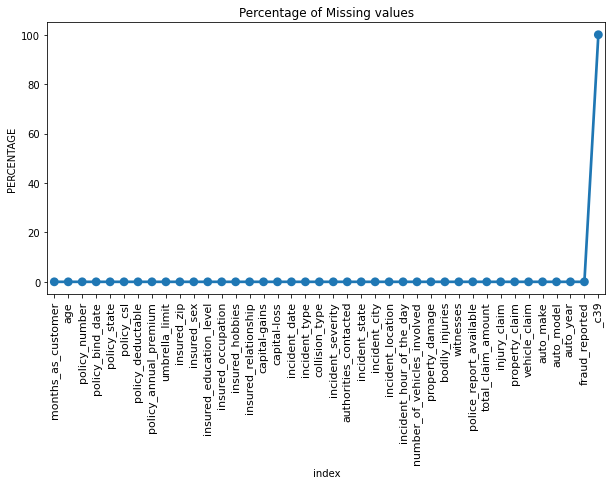

In [10]:
missing = pd.DataFrame((df.isnull().sum())*100/df.shape[0]).reset_index()
plt.figure(figsize=(10,5))
ax = sns.pointplot('index',0,data=missing)
plt.xticks(rotation =90,fontsize =11)
plt.title("Percentage of Missing values")
plt.ylabel("PERCENTAGE")
plt.show()

#### This shows nan in column _c39 which needs to be treated...

In [11]:
# Dropping _c39 column
df.drop("_c39",axis=1,inplace=True)

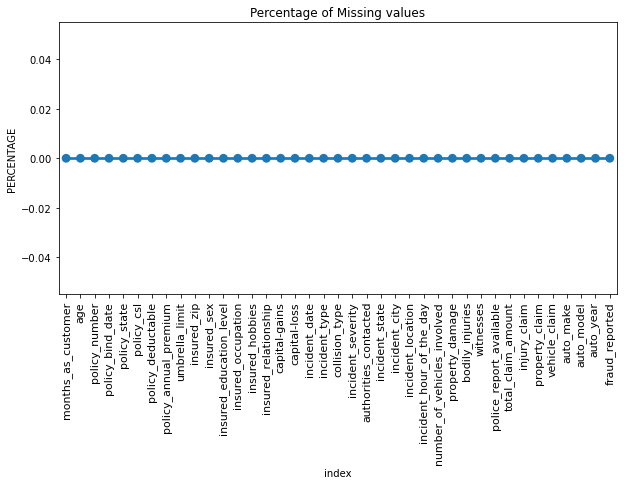

In [12]:
missing = pd.DataFrame((df.isnull().sum())*100/df.shape[0]).reset_index()
plt.figure(figsize=(10,5))
ax = sns.pointplot('index',0,data=missing)
plt.xticks(rotation =90,fontsize =11)
plt.title("Percentage of Missing values")
plt.ylabel("PERCENTAGE")
plt.show()

#### Removed column _c39 as whole column have nan value

In [13]:
# Value counts of each columns
for i in df.columns:
        print(df[i].value_counts())
        print('\n\n')
        print ('*'*100)

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64



****************************************************************************************************
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64



****************************************************************************************************
521585    1
687755    1
674485    1
223404    1
991480    1
         ..
563878    1
620855    1
583169    1
337677    1
556080    1
Name: policy_number, Length: 1000, dtype: int64



********************

### Observation
- In Collision type we have ? which is needed to be corrected
- In property damage we have ? present
- police_report_available have ? present
- By looking at the value counts of each column we can realize that the columns umbrella_limit, capital-gains and capital-loss contains more zero values and it is more than and around 50%.
- umbrella_limit columns has more that 70% of zero values, let's drop that column.

In [14]:
# Checking which columns contains "?" sign as it is a NaN value
df[df.columns[(df == '?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

#### These are the columns which contains "?" sign. We see these column to be categorical so we will replace "?" values with most frequently occuring values of the respective columns that is their mode values.

In [15]:
# Dropping umbrella_limit column bcoz around 70% of data is 0
df.drop("umbrella_limit",axis=1,inplace=True)

In [16]:
# Checking number of unique values in each column
df.nunique().to_frame("No of Unique Values")

,No of Unique Values
months_as_customer,391
age,46
policy_number,1000
policy_bind_date,951
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
insured_zip,995
insured_sex,2


#### These are the unique values present in each column.We can observe the columns policy_number and incident_location have 1000 unique values which means they have only one value count. So it not required for the prediction so we can drop it.

In [17]:
# Dropping policy_number and incident_location columns
df.drop("policy_number",axis=1,inplace=True)
df.drop("incident_location",axis=1,inplace=True)

### Converting into Datetime format

In [18]:
# Converting Date columns from object type into datetime data type
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['incident_date']=pd.to_datetime(df['incident_date'])

In [19]:
# Extracting Day, Month and Year column from policy_bind_date
df["policy_bind_Day"] = df['policy_bind_date'].dt.day
df["policy_bind_Month"] = df['policy_bind_date'].dt.month
df["policy_bind_Year"] = df['policy_bind_date'].dt.year

In [20]:
# Extracting Day, Month and Year column from incident_date
df["incident_Day"] = df['incident_date'].dt.day
df["incident_Month"] = df['incident_date'].dt.month
df["incident_Year"] = df['incident_date'].dt.year

In [21]:
# Dropping policy_bind_date and incident_date columns bcoz i have extracted data from both column
df.drop(["policy_bind_date","incident_date"],axis=1,inplace=True)

In [22]:
# Checking which columns contains "?" sign as it is a NaN value
df[df.columns[(df == '?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

### These 3 columns contains ?..  Lets replace it first..

In [23]:
df["collision_type"].mode()

0    Rear Collision
Name: collision_type, dtype: object

In [24]:
df["property_damage"].mode()

0    ?
Name: property_damage, dtype: object

In [25]:
df["police_report_available"].mode()

0     ?
1    NO
Name: police_report_available, dtype: object

#### The mode of property_damage and police_report_available is "?", which means the data is almost covered by "?" sign. So we will fill them by the second highest count of the respective column. ( ? 360 , NO 338 -> in property damage) and (? 343 , NO 343 in police report available) ,so in these case we will go with "NO"


In [26]:
# Replacing "?" by their mode values
df['collision_type'] = df.collision_type.str.replace('?', df['collision_type'].mode()[0])
df['property_damage'] = df.property_damage.str.replace('?', "NO")
df['police_report_available'] = df.police_report_available.str.replace('?', "NO")

In [27]:
print("The value count of collision_type:\n", df["collision_type"].value_counts())
print("\n\n")
print("The value count of property_damage:\n", df["property_damage"].value_counts())
print("\n\n")
print("The value count of police_report_available:\n", df["police_report_available"].value_counts())

The value count of collision_type:
 Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64



The value count of property_damage:
 NO     698
YES    302
Name: property_damage, dtype: int64



The value count of police_report_available:
 NO     686
YES    314
Name: police_report_available, dtype: int64


#### Filled ? with proper data type in each ? containing columns

#### The policy_csl column showing object data type but it contains numerical data, may be it is because of the presence of "/" in that column. So first we will extract two columns csl_per_person and csl_per_accident from policy_csl colums and then will convert their object data type into integer data type.

In [28]:
# Extracting csl_per_person and csl_per_accident from policy_csl column
df['csl_per_person'] = df.policy_csl.str.split('/', expand=True)[0]
df['csl_per_accident'] = df.policy_csl.str.split('/', expand=True)[1]

In [29]:
# Converting object data type into integer data type
df['csl_per_person'] = df['csl_per_person'].astype('int64')
df['csl_per_accident'] = df['csl_per_accident'].astype('int64')

In [30]:
# Since we have extracted the data from policy_csl, let's drop that column
df.drop("policy_csl",axis=1,inplace=True)

In [31]:
# Let's extract age of the vehicle from auto_year by subtracting it from the year 2018
df["Vehicle_Age"] = 2018 - df["auto_year"]
df.drop("auto_year",axis=1, inplace = True)

#### Here we have extracted age of the vehicle on the basis of auto year by assuming the data is collected in the year 2018.

In [32]:
# Let's check the unique values again
df.nunique().to_frame("No of Unique Values")

,No of Unique Values
months_as_customer,391
age,46
policy_state,3
policy_deductable,3
policy_annual_premium,991
insured_zip,995
insured_sex,2
insured_education_level,7
insured_occupation,14
insured_hobbies,20


#### Here incidient year have 1 unique value in whole column so i m dropping this as it is not going to contribute much to prediction

In [33]:
# Dropping incident_Year column 
df.drop("incident_Year", axis=1, inplace=True)

In [34]:
df.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,OH,1000,1406.91,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,Y,17,10,2014,25,1,250,500,14
1,228,42,IN,2000,1197.22,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,Y,27,6,2006,21,1,250,500,11
2,134,29,OH,2000,1413.14,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,N,9,6,2000,22,2,100,300,11
3,256,41,IL,2000,1415.74,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,Y,25,5,1990,1,10,250,500,4
4,228,44,IL,1000,1583.91,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,N,6,6,2014,17,2,500,1000,9


In [35]:
df.shape

(1000, 40)

### Seprating Categorical and Numerical Column

In [36]:
# Checking for categorical columns
categorical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_col.append(i)
print("Categorical columns are:\n",categorical_col)


Categorical columns are:
 ['policy_state', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


In [37]:
# Now checking for numerical columns
numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_col.append(i)
print("Numerical columns are:\n",numerical_col)

Numerical columns are:
 ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'policy_bind_Day', 'policy_bind_Month', 'policy_bind_Year', 'incident_Day', 'incident_Month', 'csl_per_person', 'csl_per_accident', 'Vehicle_Age']


#### Categrical and Numerical Column present in datset

In [38]:
# Checking the list of counts of target
df['fraud_reported'].unique()

array(['Y', 'N'], dtype=object)

In [39]:
df['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

#### From value count of fraud reported we can see that target variable is imbalanced... will balance this target variable later

In [40]:
# Checking wheather the target vaiable contains any space
df.loc[df['fraud_reported']==" "]

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age


#### No space present in dataset

In [41]:
df.shape

(1000, 40)

In [42]:
# Check any duplicate data is present or not, If present then we will drop them.
df=df.drop_duplicates()

In [43]:
df.shape

(1000, 40)

#### There was no duplicates present in dataset

<h2 style='text-align:center;font-size:50px;background-color:white;border:50px;color:pink'> A. Univariate Analysis <h2>

In [44]:
df.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_deductable',
       'policy_annual_premium', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'fraud_reported', 'policy_bind_Day', 'policy_bind_Month',
       'policy_bind_Year', 'incident_Day', 'incident_Month', 'csl_per_person',
       'csl_per_accident', 'Vehicle_Age'],
      dtype='object')

Value Count :-  N    753
Y    247
Name: fraud_reported, dtype: int64


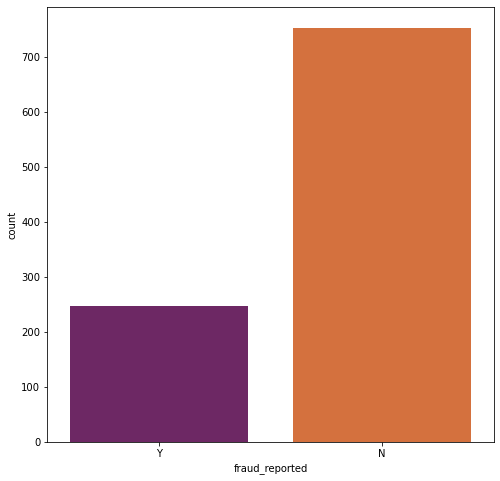

In [45]:
plt.figure(figsize=(8,8))
sns.countplot(df['fraud_reported'],palette='inferno')
print ('Value Count :- ',df['fraud_reported'].value_counts())

#### From the plot we can observe that the count of "N" is high compared to "N". Which means Here we can assume that "Y" stands for "Yes" that is the insurance is fraudulent and "N" stands for "No" means the insurance claim is not fraudulent. Here most of the insurance claims have not reported as fradulent....Since it is our target column, it indicates the class imbalance issue. We will balance the data using oversampling method in later part.



Pie plot for the column: policy_state


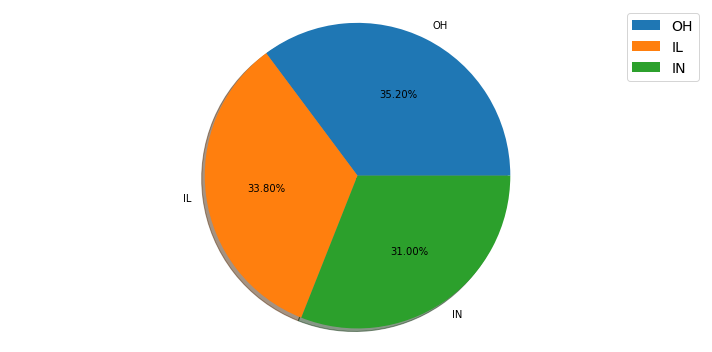

Pie plot for the column: insured_sex


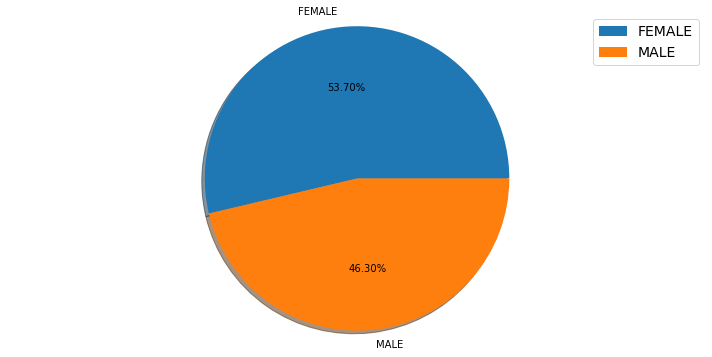

Pie plot for the column: insured_education_level


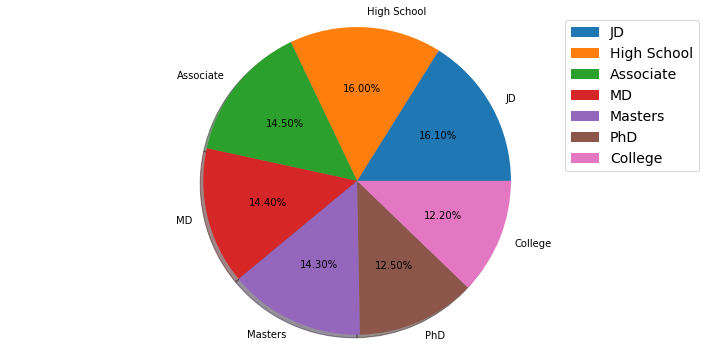

Pie plot for the column: insured_relationship


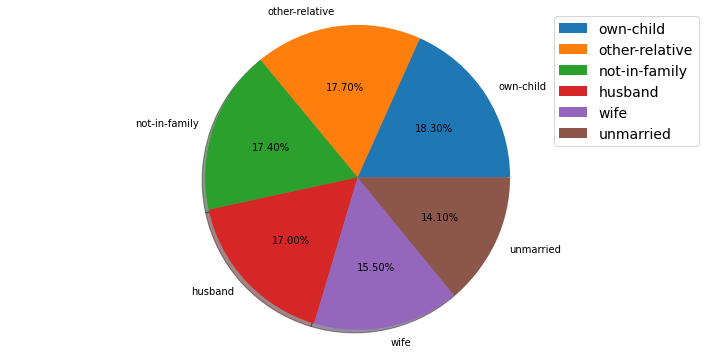

Pie plot for the column: incident_type


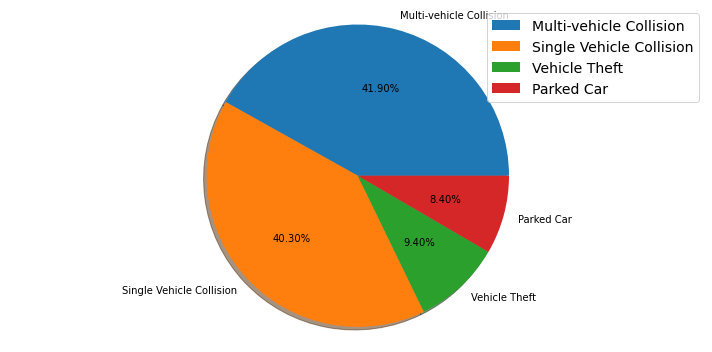

Pie plot for the column: collision_type


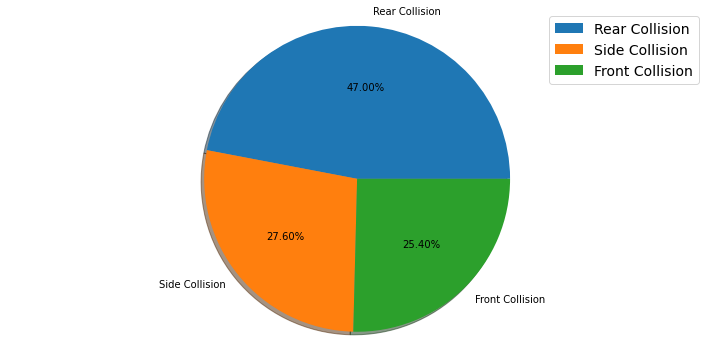

Pie plot for the column: property_damage


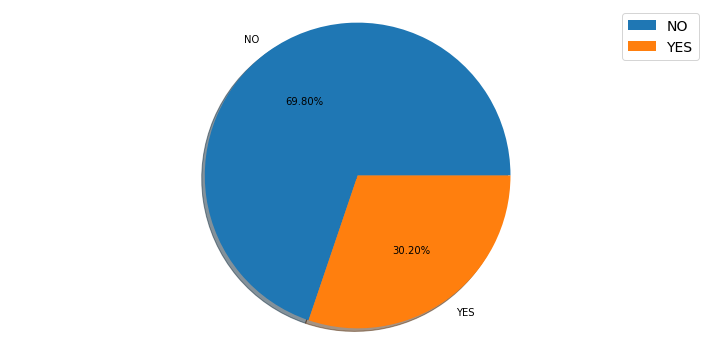

Pie plot for the column: police_report_available


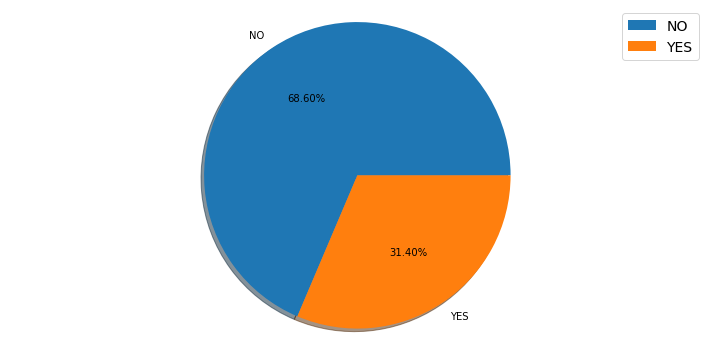

In [46]:
def generate_pie(i):
    plt.figure(figsize=(10,5))
    plt.pie(i.value_counts(), labels=i.value_counts().index, autopct='%1.2f%%',shadow=True,)
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.tight_layout()
    return plt.show()

cols1 = ['policy_state', 'insured_sex', 'insured_education_level','insured_relationship', 'incident_type','collision_type','property_damage','police_report_available']

plotnumber=1
for j in df[cols1]:
    print(f"Pie plot for the column:", j)
    generate_pie(df[j])

#### Above are the pie plots for some of the categorical columns. From the above pie plots we can observe the following things:

- The types of the policies claimed by the customers are almost same but still the policy state type HO has bit high counts and the type IL has bit less count.
- Both male and female have insurance but the count for Female is bit higher than Male counts.
- The count is pretty much same for all the education level but still the people who have completed their college and PhD have less count compared to others.
- Similar to insured education, insured relationship is also almost equally distributed.
- While looking at the incident type, Multi-vehicle collision and Single Vehicle Collision have pretty much similar counts of around 41% and 400%. But the count is very less in Parked car and Vehicle Theft.
- The collision type has 3 different types . In this the count is high in Rear collision and the other two types have almost equal counts.
- As we observe the propert damage plot, around 69% of the people did not face any property damage while 30% of the people faced the property damage.
- Over 68% of the people were produced the police reports while 31% of the people didn't submit any police reports.

In [47]:
cols2 = ['insured_occupation', 'insured_hobbies', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city','auto_make', 'auto_model']

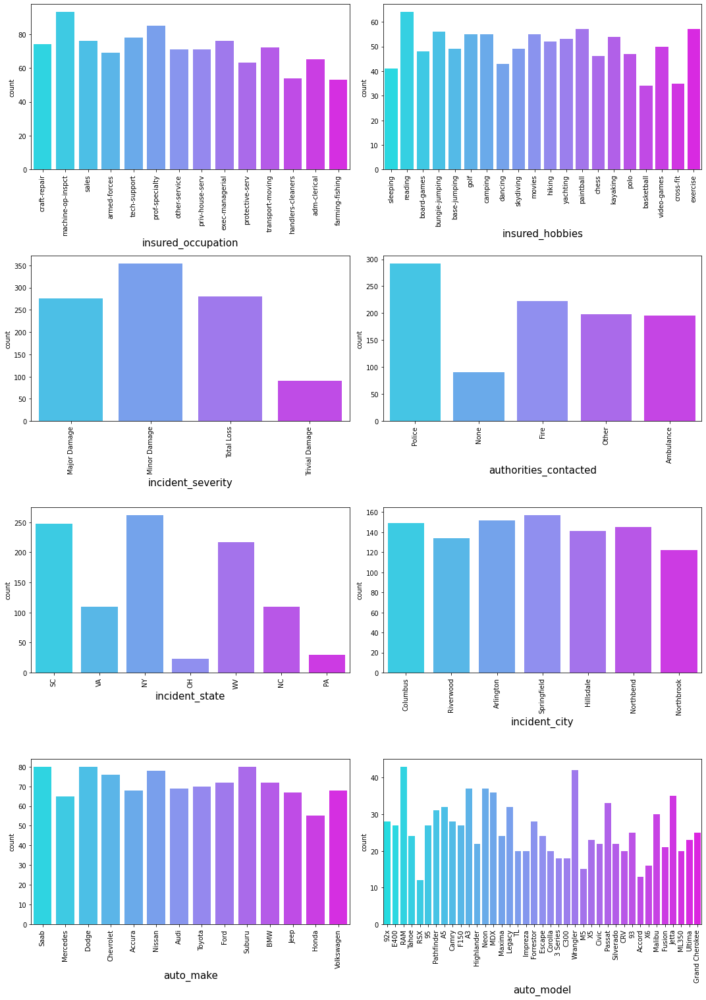

In [48]:
plt.figure(figsize=(15,25),facecolor='white')
plotnumber=1
for column in cols2:
    if plotnumber:
        ax=plt.subplot(5,2,plotnumber)
        sns.countplot(df[column],palette="cool")
        plt.xticks(rotation=90)
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.tight_layout()
plt.show()

#### ` Above are the count plots for the remaining categorical columns. From the count plots we can observe the following things`:-
- In the insured occupation we can observe most of the data is covered by machine operation inspector followed by professional speciality. Apart from this all the other insured occupations have almost same couns.
- With respect to insured hobbies, we can notice reading covered the highest data followed by exercise. And other categories have the average counts.
- The incodent severity count is high for Minor damages and trivial damage data has very less count compared to others.
- When the accidents occurs then most of the authorities contacts the police, here the the category police covers highest data and Fire having the second highest count. But Ambulance and Others have almost same counts and the count is very less for None compared to all.
- With respect to the incident state, New York, South Carolina and West Virginia states have highest counts.
- In incident city, almost all the columns have equal counts.
- When we look at the vehicle manufactured companies, the categories Saab, Suburu, Dodge, Nissan and Volkswagen have highest counts.
- When we take a look at the vehicle models then RAM and Wrangler automobile models have highest counts and also RSX and Accord have very less count.

<h2 style='text-align:center;font-size:50px;background-color:white;border:50px;color:pink'> B. Bivariate Analysis <h2>

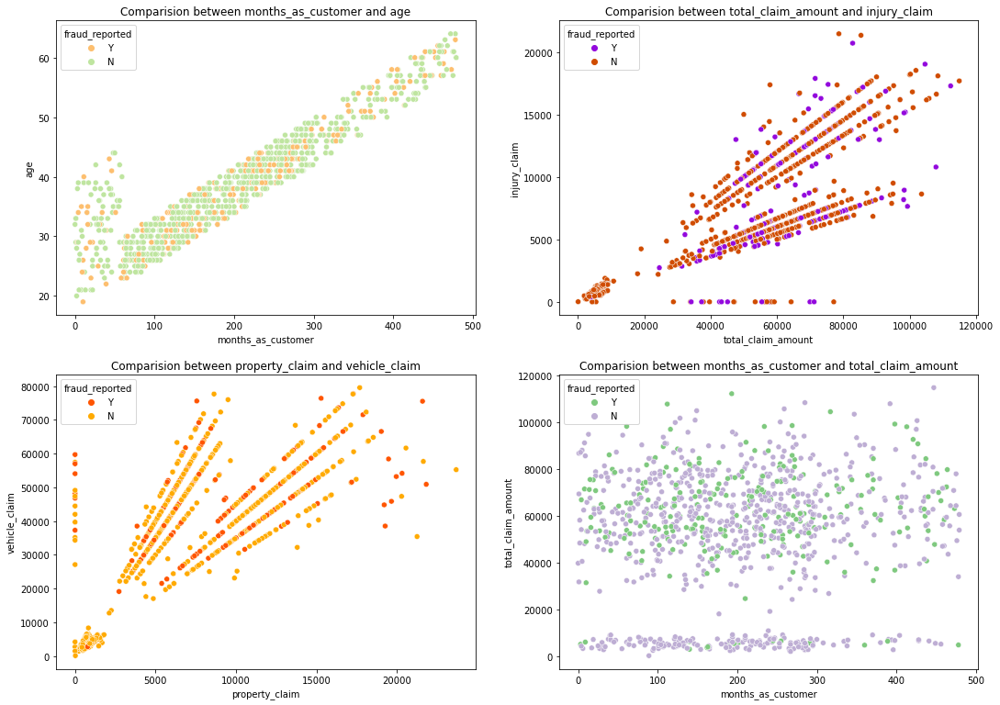

In [49]:
# Comparision between two variables
plt.figure(figsize=[18,13],facecolor='white')

plt.subplot(2,2,1)
plt.title('Comparision between months_as_customer and age')
sns.scatterplot(df['months_as_customer'],df['age'],hue=df['fraud_reported'],palette='Spectral');

plt.subplot(2,2,2)
plt.title('Comparision between total_claim_amount and injury_claim')
sns.scatterplot(df['total_claim_amount'],df['injury_claim'],hue=df['fraud_reported'],palette='gnuplot');

plt.subplot(2,2,3)
plt.title('Comparision between property_claim and vehicle_claim')
sns.scatterplot(df['property_claim'],df['vehicle_claim'],hue=df['fraud_reported'],palette='autumn');

plt.subplot(2,2,4)
plt.title('Comparision between months_as_customer and total_claim_amount')
sns.scatterplot(df['months_as_customer'],df['total_claim_amount'],hue=df['fraud_reported'],palette='Accent');

#### From the above scatter plot we can observe the following things:-
- There is a positive linear relation between age and month_as_customer column. As age increases the month_as customers also increases, also the fraud reported is very less in htis case.
- In the second graph we can observe the positive linear relation, as total claim amount increases, injury claim is also increases.
- Third plot is also same as second one that is as the property claim increases, vehicle claim is also increases.
- In the fourth plot we can observe the data is scattered and there is no much relation between the features.

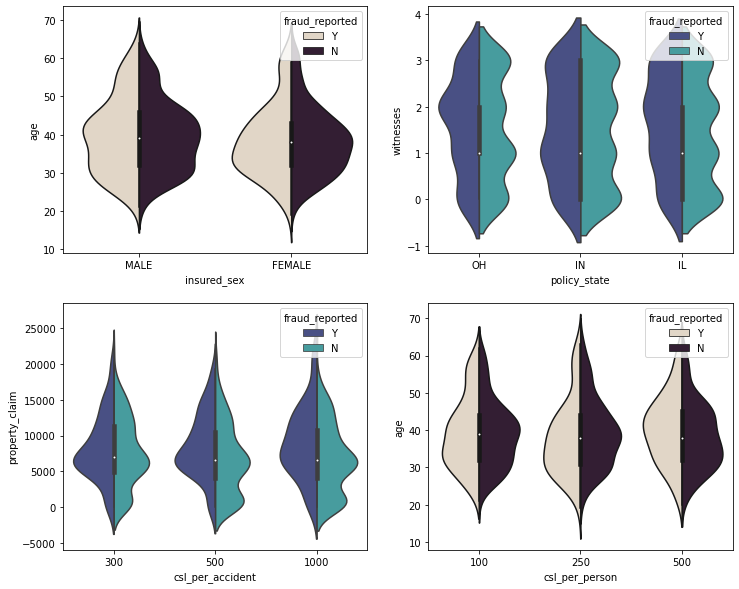

In [50]:
fig,axes=plt.subplots(2,2,figsize=(12,10))

# Comparing insured_sex and age
sns.violinplot(x='insured_sex',y='age',ax=axes[0,0],data=df,palette="ch:.25",hue="fraud_reported",split=True)

# Comparing policy_state and witnesses
sns.violinplot(x='policy_state',y='witnesses',ax=axes[0,1],data=df,hue="fraud_reported",split=True,palette="mako")

# Comparing csl_per_accident and property_claim
sns.violinplot(x='csl_per_accident',y='property_claim',ax=axes[1,0],data=df,hue="fraud_reported",split=True,palette="mako")

# Comparing csl_per_person and age
sns.violinplot(x='csl_per_person',y='age',ax=axes[1,1],data=df,hue="fraud_reported",split=True,palette="ch:.25")
plt.show()

#### Observation from above plot:
- The fraud report is high for both the males females having age between 30-45.
- The people who own the policy state "IN" have high fraud report.
- The person who has csl per accident insurance by claiming property in the range 5000-15000 have the fraud report.
- The csl_per_person with age 30-45 are facing the fraudulent reports.

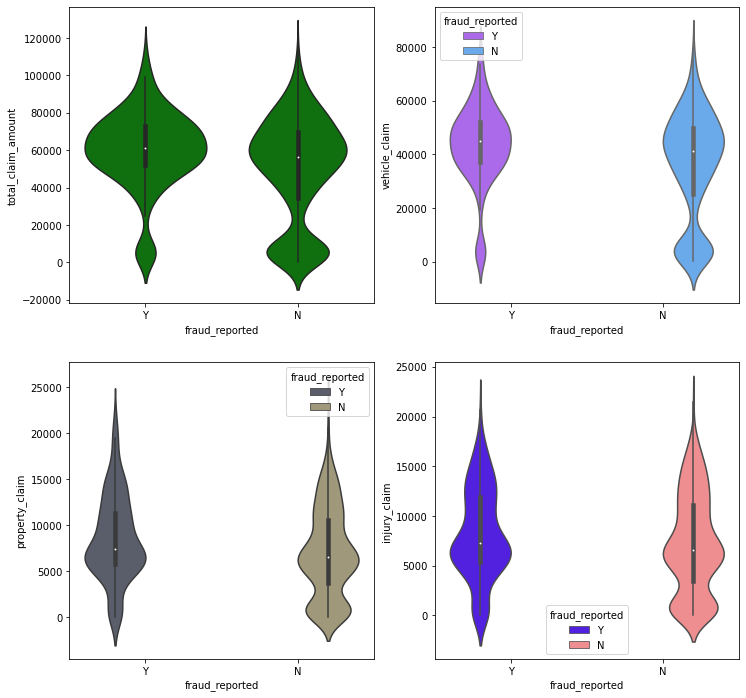

In [51]:
fig,axes=plt.subplots(2,2,figsize=(12,12))

# Comparing insured_sex and age
sns.violinplot(x='fraud_reported',y='total_claim_amount',ax=axes[0,0],data=df,color="g")

# Comparing policy_state and witnesses
sns.violinplot(x='fraud_reported',y='vehicle_claim',ax=axes[0,1],data=df,hue="fraud_reported",palette="cool_r")

# Comparing csl_per_accident and property_claim
sns.violinplot(x='fraud_reported',y='property_claim',ax=axes[1,0],data=df,hue="fraud_reported",palette="cividis")

# Comparing csl_per_person and age
sns.violinplot(x='fraud_reported',y='injury_claim',ax=axes[1,1],data=df,hue="fraud_reported",palette="gnuplot2")
plt.show()

#### Observation from above plot:
- Most of the fraud reports found when the total claimed amount is 5000-70000.
- The fraud report is high when the claimed vehicle is between 3700-5900.
- The frad reports is high when the property claimed is between 5200-8500.
- Most fraud reported when injury claim are between 5000 to 8000.

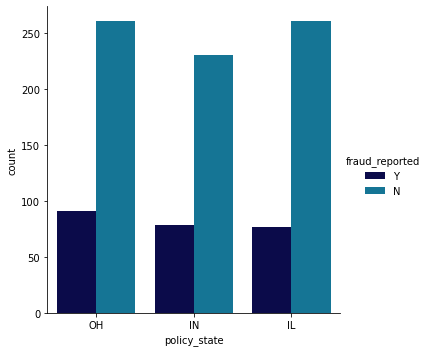

In [52]:
# Comparing policy_state and fraud_reported
sns.factorplot('policy_state',kind='count',data=df,hue='fraud_reported',palette="ocean")
plt.show()

#### Fraud report is bit high in the "OH" policy state.

<Figure size 576x576 with 0 Axes>

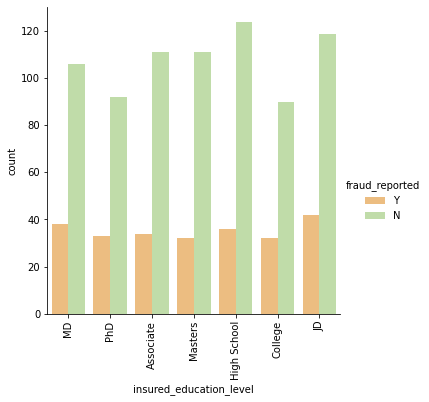

In [53]:
# Comparing insured_education_level and fraud_reportedplt.figure(figsize=(10,5),facecolor='orange')plt.figure(figsize=(10,5),facecolor='orange')
plt.figure(figsize=(8,8))
sns.factorplot('insured_education_level',kind='count',data=df,hue='fraud_reported',palette="Spectral")
plt.xticks(rotation=90)
plt.show()

#### The fraudulent level is very less for the people who have high school education and the people who have completed their "JD" education have high fraud report. The people who have high insured education are facing insurance fraudulent compared to the people with less insured education level.

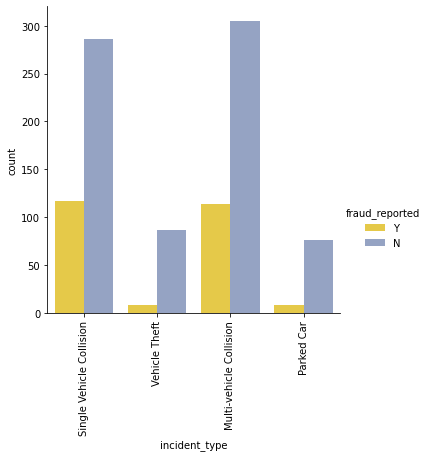

In [54]:
# Comparing incident_type and fraud_reported
sns.factorplot('incident_type',kind='count',data=df,hue='fraud_reported',palette="Set2_r")
plt.xticks(rotation=90)
plt.show()

#### In Multivehicle collission and single vehicle collision, the fraud report is very high compared to others

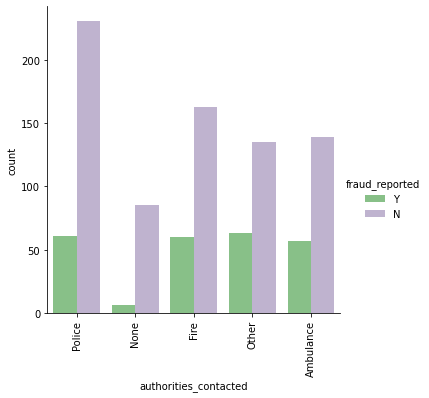

In [55]:
# Comparing authorities_contacted and fraud_reported
sns.factorplot('authorities_contacted',kind='count',data=df,hue='fraud_reported',palette="Accent")
plt.xticks(rotation=90)
plt.show()

#### The police contacted cases are very high and the fraud report is in equal for all the authorities except None.

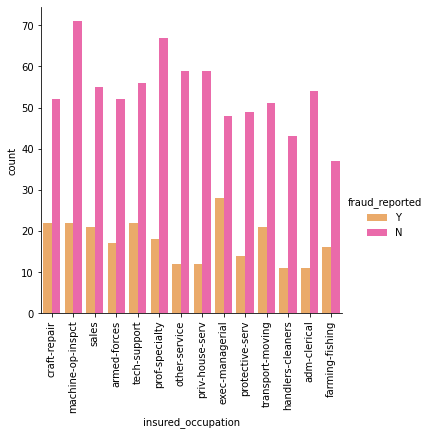

In [56]:
# Comparing insured_occupation and fraud_reported
sns.factorplot('insured_occupation',kind='count',data=df,hue='fraud_reported',palette="spring_r")
plt.xticks(rotation=90)
plt.show()

#### The people who are in the position exec-managerials have high fraud reports compared to others.

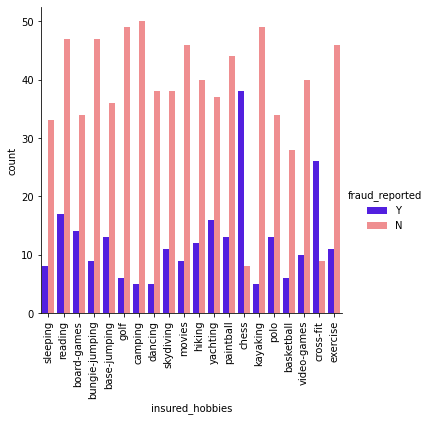

In [57]:
# Comparing insured_hobbies and fraud_reported
sns.factorplot('insured_hobbies',kind='count',data=df,hue='fraud_reported',palette="gnuplot2")
plt.xticks(rotation=90)
plt.show()

#### The fraud report is high for the people who have the hobby of playing chess and cross fit.

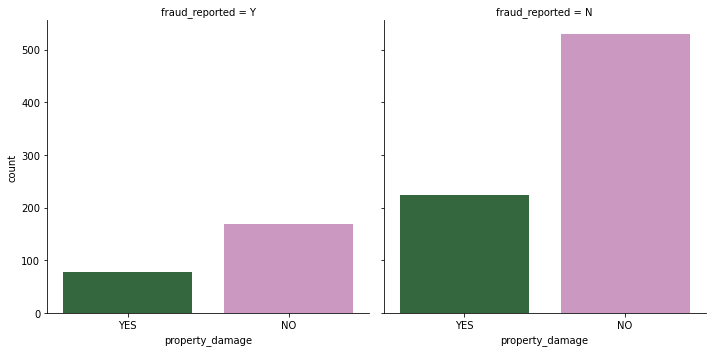

In [58]:
# Comparing property_damage and fraud_reported
sns.factorplot('property_damage',kind='count',data=df,col='fraud_reported',palette="cubehelix")
plt.show()

#### The customers who do not have any property damage case they have high fraud reports.

<h2 style='text-align:center;font-size:50px;background-color:white;border:50px;color:pink'> C. Multivariate Analysis <h2>

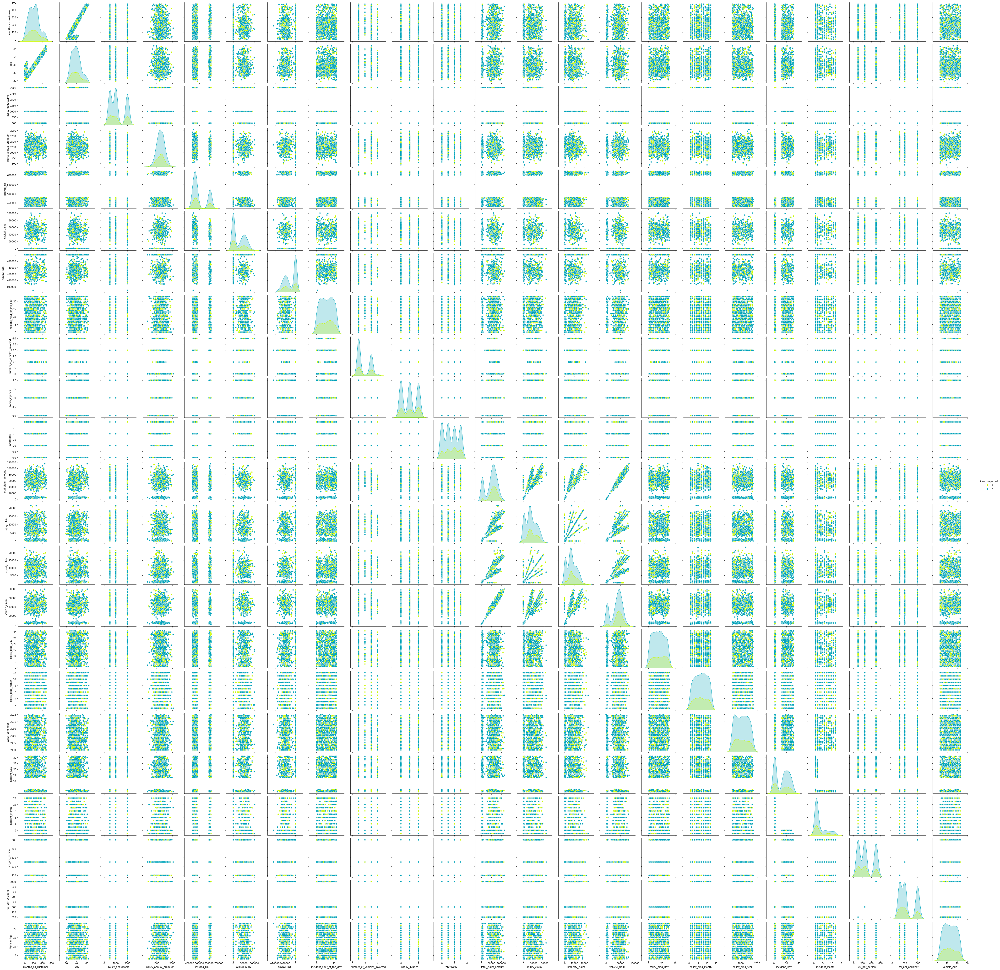

In [59]:
sns.pairplot(df,hue="fraud_reported",palette="nipy_spectral_r")
plt.show()

- The pairplot gives the pairwise relation between the features on the basis of the target "fraud_reported". On the diagonal we can notice the distribution plots.
- From the pair plot we can observe some of the features have strong correlation with each other.
- We can also find some outliers presentin the data, we will remove them using either Zscore or IQR method.

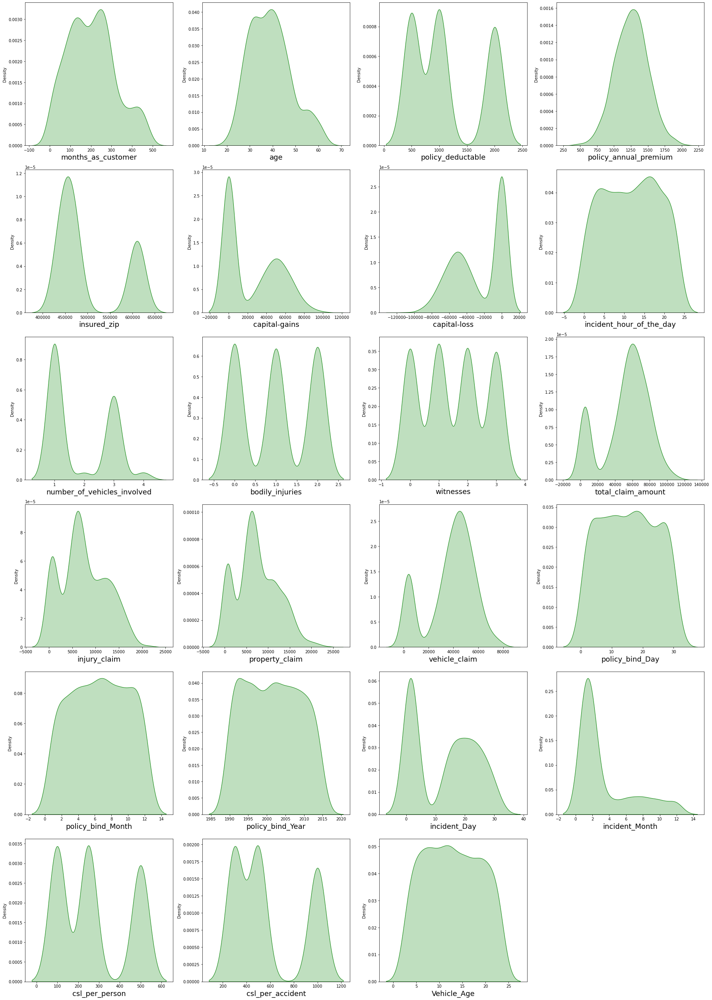

In [59]:
# Checking how the data has been distriubted in each column

plt.figure(figsize=(25,35),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(df[column],color="green",hist=False,kde_kws={"shade": True})
        plt.xlabel(column,fontsize=18)
    plotnumber+=1
plt.tight_layout()

#### Above are the distribution plots for all the numerical columns. From the distplots we can observe the following things:
- The data is normally distributed in most of the columns.
- Some of the columns like capital gains and incident months have mean value greater than the median, hence they are skewed to right.
- The data in the column capital loss is skewed to left since the median is greater than the mean

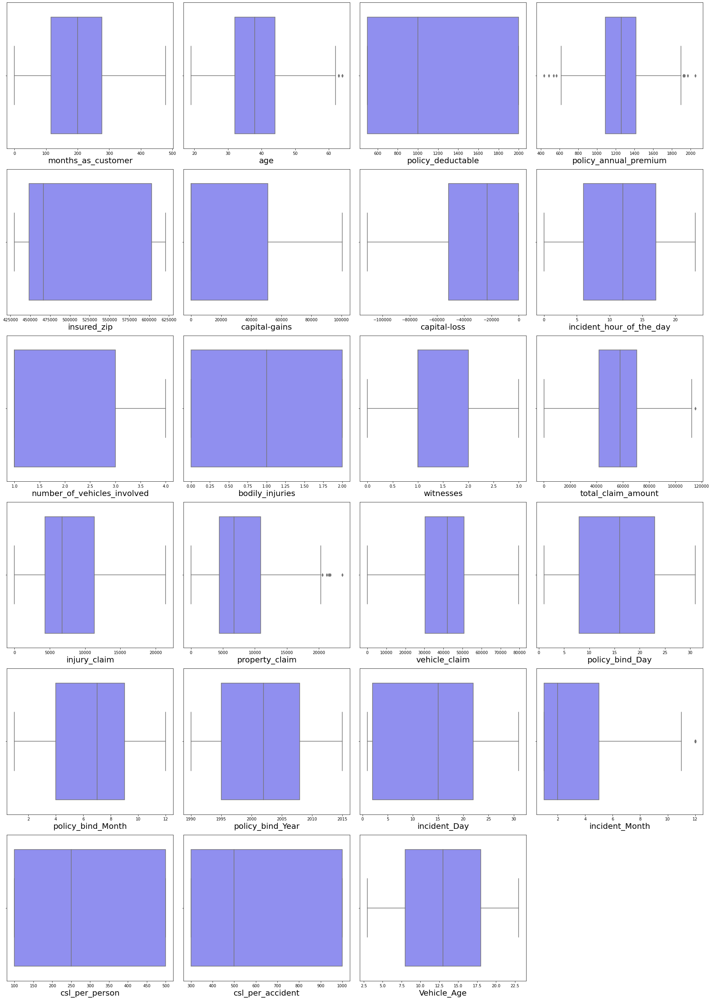

In [60]:
# Let's check the outliers by ploting box plot

plt.figure(figsize=(25,35),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.boxplot(df[column],palette="cool")
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

#### We can find the outliers in the following columns:

- age
- policy_annual_premium
- total_claim_amount
- property_claim
- incident_month


<h2 style='text-align:center;font-size:60px;background-color:white;border:40px;color:pink'> DESCRIPTIVE STATISTICS <h2>

In [61]:
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,15.448000,6.559000,2001.604000,13.08400,3.407000,272.650000,580.200000,12.897000
std,115.113174,9.140287,611.864673,244.167395,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,8.850176,3.391758,7.360391,10.44318,3.276291,161.603196,287.420547,6.015861
min,0.000000,19.000000,500.000000,433.330000,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1.000000,1.000000,1990.000000,1.00000,1.000000,100.000000,300.000000,3.000000
25%,115.750000,32.000000,500.000000,1089.607500,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,8.000000,4.000000,1995.000000,2.00000,1.000000,100.000000,300.000000,8.000000
50%,199.500000,38.000000,1000.000000,1257.200000,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,16.000000,7.000000,2002.000000,15.00000,2.000000,250.000000,500.000000,13.000000
75%,276.250000,44.000000,2000.000000,1415.695000,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,23.000000,9.000000,2008.000000,22.00000,5.000000,500.000000,1000.000000,18.000000
max,479.000000,64.000000,2000.000000,2047.590000,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,31.000000,12.000000,2015.000000,31.00000,12.000000,500.000000,1000.000000,23.000000


This gives the statistical information of the numerical columns present in the dataframe. The summary of this dataset looks perfect since there is no negative/ invalid values present.

From the above description we can observe the following things:

Here the counts of all the columns are equal which means there are no missing values in the dataset. In some of the columns like policy_deductable, capital-gains, injury_claim etc we can observe the mean value is greater than the median(50%) which means the data in those columns are skewed to right. And in some of the columns like total_claim_amount, vehicle_claim...etc we can observe the median is greater than the mean which means the data in the columns are skewed to left. And some of the columns have equal mean and median that means the data symmetric and is normally distributed and no skewness preaent. There is a huge difference in 75% and max it shows that huge outliers present in the columns.

<AxesSubplot:>

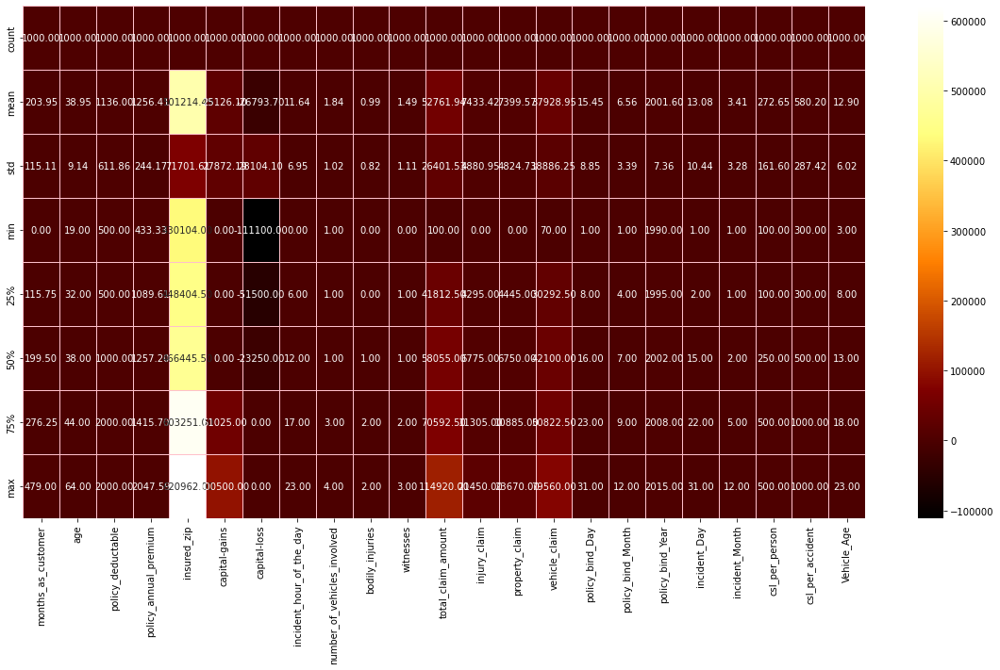

In [62]:
plt.figure(figsize=(20,10))
sns.heatmap(df.describe(),annot=True,linewidths=0.5,linecolor="pink",fmt="0.2f",cmap='afmhot')

 <h2 style='text-align:center;font-size:50px;background-color:white;border:30px;color:pink'>  Lets Remove Outliers Now <h2>

# ZScore Method

In [59]:
# Features containing outliers
features = df[["age" ,"policy_annual_premium","property_claim","incident_Month",'total_claim_amount']]

# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features))

z

,age,policy_annual_premium,property_claim,incident_Month,total_claim_amount
0,0.990836,0.616705,1.165505,0.735040,0.714257
1,0.334073,0.242521,1.372696,0.735040,1.807312
2,1.088913,0.642233,0.736072,0.429664,0.686362
3,0.224613,0.652886,0.219722,2.013343,0.403135
4,0.552994,1.341980,1.399654,0.429664,1.753121
...,...,...,...,...,...
995,0.103769,0.222884,0.273817,0.429664,1.305049
996,0.224613,0.739141,2.214794,0.735040,2.111466
997,0.541611,0.520739,0.020826,0.735040,0.558507
998,2.523284,0.411866,0.451976,0.429664,0.219110


In [60]:
# Creating new dataframe
df_new = df[(z<3).all(axis=1)] 
df_new

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,OH,1000,1406.91,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,Y,17,10,2014,25,1,250,500,14
1,228,42,IN,2000,1197.22,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,Y,27,6,2006,21,1,250,500,11
2,134,29,OH,2000,1413.14,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,N,9,6,2000,22,2,100,300,11
3,256,41,IL,2000,1415.74,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,Y,25,5,1990,1,10,250,500,4
4,228,44,IL,1000,1583.91,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,N,6,6,2014,17,2,500,1000,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,Accord,N,16,7,1991,22,2,500,1000,12
996,285,41,IL,1000,1436.79,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,Passat,N,1,5,2014,24,1,100,300,3
997,130,34,OH,500,1383.49,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,N,17,2,2003,23,1,250,500,22
998,458,62,IL,2000,1356.92,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,A5,N,18,11,2011,26,2,500,1000,20


In [61]:
df_new.shape

(996, 40)

In [62]:
df.shape

(1000, 40)

In [63]:
# Percentage of data loss

DataLoss=((1000-996)/1000)*100
DataLoss

0.4

### 0.4% of data loss in zscore

# IQR Method

In [64]:
#1st quantile
Q1=df.quantile(0.25)

# 3rd quantile
Q3=df.quantile(0.75)

#IQR
IQR=Q3 - Q1
qq=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [65]:
print("Old DataFrame data in Rows and Column:",df.shape)
print("\nNew DataFrame data in Rows and Column:",qq.shape)
print("\nTotal Dropped rows:",df.shape[0]-qq.shape[0])

Old DataFrame data in Rows and Column: (1000, 40)

New DataFrame data in Rows and Column: (942, 40)

Total Dropped rows: 58


In [66]:
#Percentage Data Loss using IQR
data_loss1 = (1000-942)/1000*100
data_loss1

5.800000000000001

### 5.8% of data loss in iqr method

### chossing zscore as there is less data loss in zscore

<h2 style='text-align:center;font-size:60px;background-color:white;border:30px;color:pink'> Now Lets Remove Skewness <h2>

In [67]:
df_new.skew()

months_as_customer             0.359605
age                            0.474526
policy_deductable              0.473229
policy_annual_premium          0.032042
insured_zip                    0.825568
capital-gains                  0.478850
capital-loss                  -0.393015
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.500364
bodily_injuries                0.011117
witnesses                      0.025758
total_claim_amount            -0.593473
injury_claim                   0.267970
property_claim                 0.357130
vehicle_claim                 -0.619755
policy_bind_Day                0.028923
policy_bind_Month             -0.029722
policy_bind_Year               0.058499
incident_Day                   0.055659
incident_Month                 1.377097
csl_per_person                 0.413713
csl_per_accident               0.609316
Vehicle_Age                    0.049276
dtype: float64

In [68]:
L1=['insured_zip','number_of_vehicles_involved','total_claim_amount','vehicle_claim','incident_Month']

In [69]:
# Lets remove the skewness from given columns by Power Transform Method

from sklearn.preprocessing import PowerTransformer
PT = PowerTransformer(method='yeo-johnson')

In [70]:
#Removing skewness using yeo-johnson
df_new[['insured_zip','number_of_vehicles_involved','total_claim_amount','vehicle_claim','incident_Month']] = PT.fit_transform(df_new[['insured_zip','number_of_vehicles_involved','total_claim_amount','vehicle_claim','incident_Month']].values)

In [71]:
#Checking skewness after removing skewness by power transform
df_new.skew()

months_as_customer             0.359605
age                            0.474526
policy_deductable              0.473229
policy_annual_premium          0.032042
insured_zip                    0.000000
capital-gains                  0.478850
capital-loss                  -0.393015
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.361213
bodily_injuries                0.011117
witnesses                      0.025758
total_claim_amount            -0.508953
injury_claim                   0.267970
property_claim                 0.357130
vehicle_claim                 -0.521354
policy_bind_Day                0.028923
policy_bind_Month             -0.029722
policy_bind_Year               0.058499
incident_Day                   0.055659
incident_Month                 0.305741
csl_per_person                 0.413713
csl_per_accident               0.609316
Vehicle_Age                    0.049276
dtype: float64

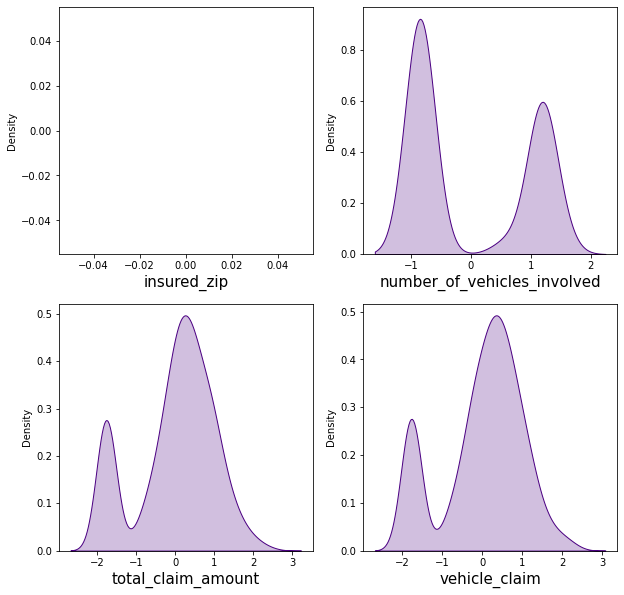

In [72]:
# After removing skewness let's check how the data has been distributed in each column.

plt.figure(figsize=(10,10), facecolor='white')
plotnumber = 1

for column in df_new[L1]:
    if plotnumber<=4:
        ax = plt.subplot(2,2,plotnumber)
        sns.distplot(df_new[column],color='indigo',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

#### The data looks almost normal after removing the skewness compared to the previous data.

<h2 style='text-align:center;font-size:50px;background-color:white;border:50px;color:pink'> CORRELATION <h2>

In [73]:
df_new.dtypes

months_as_customer               int64
age                              int64
policy_state                    object
policy_deductable                int64
policy_annual_premium          float64
insured_zip                    float64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved    float64
property_damage                 object
bodily_injuries                  int64
witnesses                        int64
police_report_available         object
total_claim_amount       

# Lets Convert all catagorical columns to Numerical by Encoding 

In [74]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in df_new.columns:
    if df_new[i].dtypes=="object":
        df_new[i]=le.fit_transform(df_new[i].values.reshape(-1,1))
df_new

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,2,1000,1406.91,0.0,1,4,2,17,0,53300,0,2,2,0,4,4,1,5,-0.844799,1,1,2,1,0.717556,6510,13020,0.754553,10,1,1,17,10,2014,25,-1.101370,250,500,14
1,228,42,1,2000,1197.22,0.0,1,4,6,15,2,0,0,3,1,1,4,5,5,8,-0.844799,0,0,0,0,-1.777785,780,780,-1.787353,8,12,1,27,6,2006,21,-1.101370,250,500,11
2,134,29,2,2000,1413.14,0.0,0,6,11,2,3,35100,0,0,1,1,4,1,1,7,1.187846,0,2,3,0,-0.716483,7700,3850,-0.820820,4,30,0,9,6,2000,22,-0.026479,100,300,11
3,256,41,0,2000,1415.74,0.0,0,6,1,2,4,48900,-62400,2,0,0,4,2,0,5,-0.844799,0,1,2,0,0.392931,6340,6340,0.678427,3,34,1,25,5,1990,1,1.553647,250,500,4
4,228,44,0,1000,1583.91,0.0,1,0,11,2,4,66000,-46000,3,1,1,2,1,0,20,-0.844799,0,0,1,0,-1.730555,1300,650,-1.740710,0,31,0,6,6,2014,17,-0.026479,500,1000,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,1000,1310.80,0.0,0,5,2,13,4,0,0,2,0,1,1,0,4,20,-0.844799,1,0,1,0,1.341314,17440,8720,1.260237,6,6,0,16,7,1991,22,-0.026479,500,1000,12
996,285,41,0,1000,1436.79,0.0,0,6,9,17,5,70900,0,2,1,0,1,4,3,23,-0.844799,1,2,3,0,2.205819,18080,18080,1.906028,13,28,0,1,5,2014,24,-1.101370,100,300,3
997,130,34,2,500,1383.49,0.0,0,5,1,3,2,35100,0,0,2,1,4,0,0,4,1.187846,0,2,3,1,0.554684,7500,7500,0.778098,11,19,0,17,2,2003,23,-1.101370,250,500,22
998,458,62,0,2000,1356.92,0.0,1,0,5,0,5,0,0,2,1,0,3,1,0,2,-0.844799,0,0,1,1,-0.246683,5220,5220,-0.103792,1,5,0,18,11,2011,26,-0.026479,500,1000,20


In [75]:
df_new.corr()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
months_as_customer,1.000000,0.922092,0.000118,0.023512,-0.003378,NaN,0.059002,-0.000848,0.005365,-0.092575,0.071097,0.007601,0.020771,-0.017202,-0.072479,-0.061932,0.011406,0.006906,-0.001837,0.068962,0.015588,0.002663,-0.011126,0.063530,-0.018760,0.064662,0.066416,0.041157,0.062392,0.049222,0.002908,0.020966,0.054175,0.004955,-0.046010,-0.013502,0.019029,-0.022063,-0.021145,-0.001287
age,0.922092,1.000000,-0.015182,0.026772,0.005890,NaN,0.072900,0.001485,0.014030,-0.080587,0.075940,-0.006333,0.008192,-0.025979,-0.075892,-0.060361,0.016000,0.007053,-0.004009,0.085509,0.021021,-0.005795,-0.017461,0.056658,-0.018493,0.070582,0.075480,0.064230,0.062165,0.032105,0.016258,0.012408,0.054465,0.015874,-0.035505,-0.008174,0.016685,-0.012844,-0.012967,-0.003268
policy_state,0.000118,-0.015182,1.000000,0.010740,0.014475,NaN,-0.019294,-0.032551,-0.031016,-0.040215,-0.018855,0.072552,-0.032268,0.031769,0.050953,-0.026728,-0.017738,0.009195,-0.004475,0.026464,-0.041368,-0.009334,0.008992,0.024809,0.065957,-0.008788,-0.046398,0.002678,-0.000472,0.015848,-0.024513,0.028864,0.001030,0.071527,-0.005709,0.013370,0.026233,-0.005866,-0.009652,-0.002323
policy_deductable,0.023512,0.026772,0.010740,1.000000,-0.008445,NaN,-0.011671,0.014571,-0.050024,0.005134,-0.021763,0.035950,-0.024018,-0.038696,-0.054153,-0.017352,-0.000210,0.007419,-0.046560,0.059733,0.054755,0.014131,-0.023384,0.069433,0.040969,0.025169,0.040337,0.069537,0.005902,-0.034266,-0.003597,0.015833,0.011204,-0.051368,-0.048465,-0.018867,-0.000169,0.006634,0.006888,-0.027497
policy_annual_premium,-0.003378,0.005890,0.014475,-0.008445,1.000000,NaN,0.041830,-0.021475,0.030963,-0.014376,0.006474,-0.009757,0.029835,0.049336,0.034999,-0.015788,-0.058852,0.049047,0.047389,-0.003001,-0.044719,0.078922,0.025323,0.006365,0.029619,0.002905,-0.024031,-0.007964,0.012961,0.011595,-0.034998,-0.010174,-0.030886,-0.028452,0.001650,0.016400,-0.012386,0.028569,0.026591,0.040439
insured_zip,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
insured_sex,0.059002,0.072900,-0.019294,-0.011671,0.041830,NaN,1.000000,0.007473,-0.009257,-0.019600,0.004104,-0.020651,-0.024440,0.010572,-0.014399,-0.029576,0.019000,-0.021822,0.013251,0.017950,0.013684,0.025911,-0.020201,0.044173,0.009884,-0.020117,0.004603,-0.009457,-0.026816,0.026040,-0.017679,0.032173,0.045694,-0.007259,-0.031981,-0.007249,0.024223,-0.019001,-0.026198,0.028638
insured_education_level,-0.000848,0.001485,-0.032551,0.014571,-0.021475,NaN,0.007473,1.000000,-0.021502,0.022806,-0.021595,0.040283,0.039890,0.012385,-0.020687,-0.007395,-0.011831,-0.006118,-0.019160,-0.057232,-0.001818,-0.048624,-0.011455,0.017577,0.054380,0.076528,0.083672,0.058663,0.070001,0.057528,0.050878,0.011520,0.014464,-0.007489,0.017801,-0.055411,0.069312,0.011093,0.011448,-0.045094
insured_occupation,0.005365,0.014030,-0.031016,-0.050024,0.030963,NaN,-0.009257,-0.021502,1.000000,-0.009818,-0.008141,-0.007553,-0.021993,0.003427,0.006634,0.002255,-0.007367,-0.021531,-0.002158,-0.021308,-0.014772,-0.018839,-0.001830,-0.011373,-0.021730,0.006458,0.022693,0.008301,0.000954,0.044321,0.020878,0.003335,-0.003030,0.024516,-0.025282,-0.022786,0.013226,0.018978,0.018298,0.004827
insured_hobbies,-0.092575,-0.080587,-0.040215,0.005134,-0.014376,NaN,-0.0

#### This gives correlation beyween dependent and independent variable

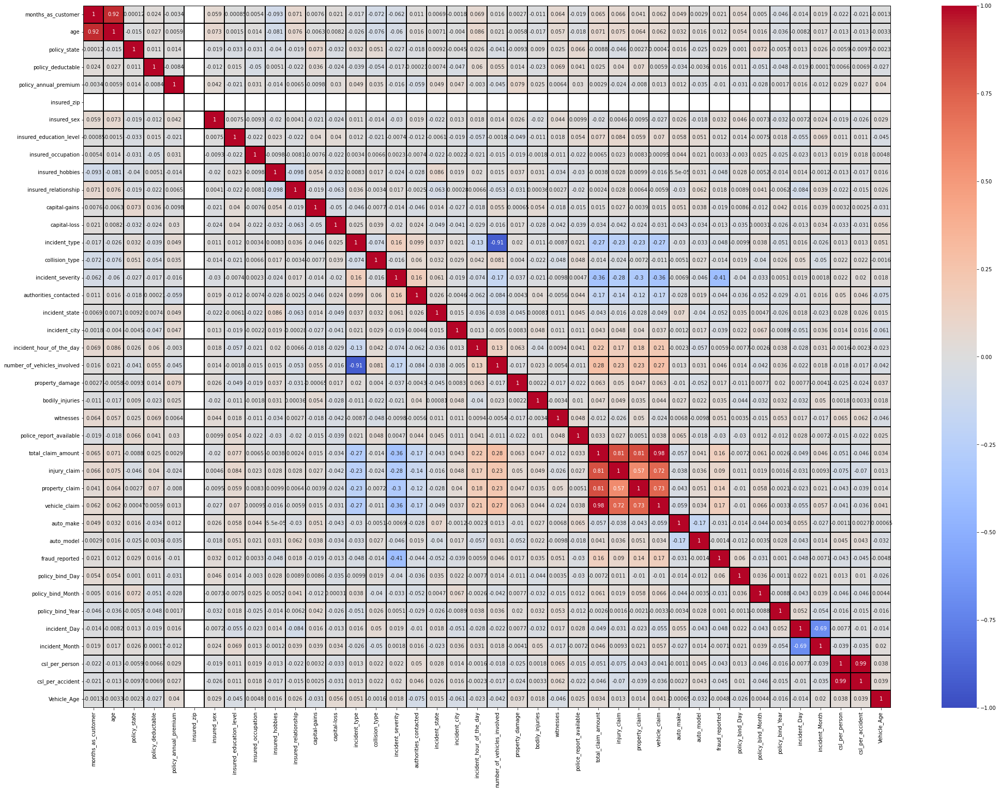

In [76]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(35,25))
sns.heatmap(df_new.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.2g', annot = True, linecolor="black",annot_kws={'size':10},cmap="coolwarm")
plt.yticks(rotation=0);

This heatmap shows the correlation matrix by visualizing the data. we can observe the relation between one feature to other.

This heat mapcontains both positive and negative correlation.

There is very less correlation between the target and the label.
We can observe the most of the columns are highly correlated with each other which leads to the multicollinearity problem.
We will check the VIF value to overcome with this multicollinearity problem.

In [77]:
df_new.corr()['fraud_reported'].sort_values()

incident_severity             -0.405287
incident_state                -0.051534
incident_Day                  -0.048187
insured_hobbies               -0.047983
incident_type                 -0.047850
csl_per_accident              -0.045080
authorities_contacted         -0.043676
csl_per_person                -0.042820
incident_city                 -0.038545
policy_bind_Month             -0.031288
auto_make                     -0.031261
police_report_available       -0.030419
capital-gains                 -0.018919
collision_type                -0.014184
capital-loss                  -0.012552
policy_annual_premium         -0.010174
incident_Month                -0.007073
Vehicle_Age                   -0.004758
auto_model                    -0.001416
policy_bind_Year               0.001029
insured_occupation             0.003335
incident_hour_of_the_day       0.005863
insured_education_level        0.011520
age                            0.012408
policy_deductable              0.015833


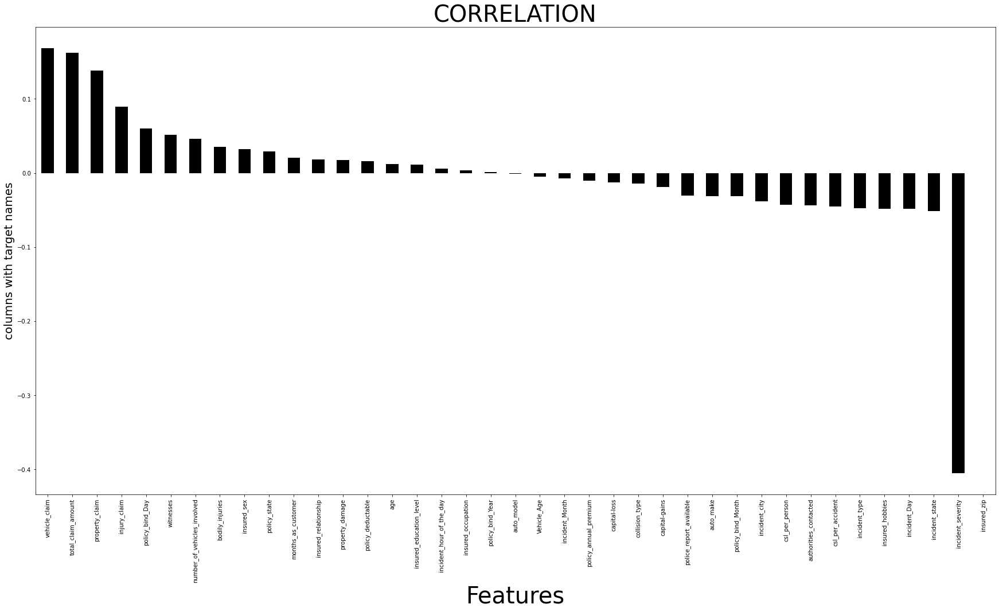

In [78]:
#checking the columns which are positively and negatively correlated

plt.figure(figsize=(30,15))
df_new.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='black')
plt.xlabel('Features',fontsize=40)
plt.ylabel('columns with target names',fontsize=20)
plt.title('CORRELATION',fontsize=40)
plt.show()

#### Correlation of Traget with Feature

In [79]:
## dropping least correlated column with target
df_new.drop('auto_model',axis=1,inplace=True)
df_new.drop('policy_bind_Year',axis=1,inplace=True)

In [80]:
## dropping insured zip as it contains whole nana in correlation with target
df_new.drop("insured_zip",axis=1,inplace=True)

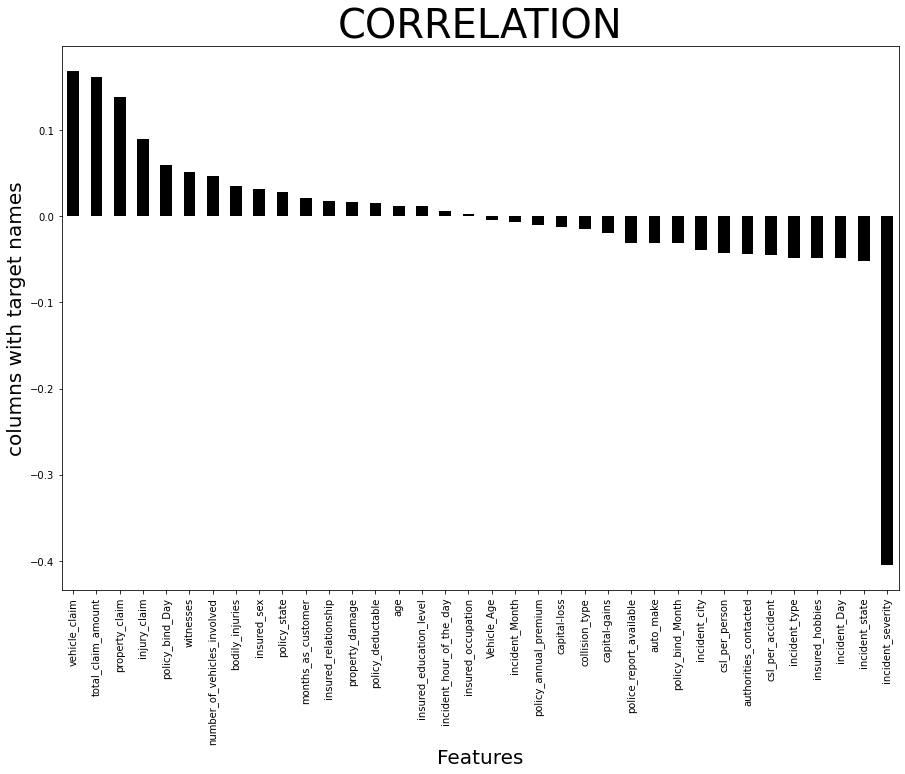

In [81]:
#checking the columns which are positively and negatively correlated

plt.figure(figsize=(15,10))
df_new.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='black')
plt.xlabel('Features',fontsize=20)
plt.ylabel('columns with target names',fontsize=20)
plt.title('CORRELATION',fontsize=40)
plt.show()

#### now correlation looks better

<h2 style='text-align:center;font-size:40px;background-color:white;border:40px;color:pink'> Now Lets Split the dataset into dependent and independent variable <h2>

In [82]:
df_new.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,fraud_reported,policy_bind_Day,policy_bind_Month,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
0,328,48,2,1000,1406.91,1,4,2,17,0,53300,0,2,2,0,4,4,1,5,-0.844799,1,1,2,1,0.717556,6510,13020,0.754553,10,1,17,10,25,-1.101370,250,500,14
1,228,42,1,2000,1197.22,1,4,6,15,2,0,0,3,1,1,4,5,5,8,-0.844799,0,0,0,0,-1.777785,780,780,-1.787353,8,1,27,6,21,-1.101370,250,500,11
2,134,29,2,2000,1413.14,0,6,11,2,3,35100,0,0,1,1,4,1,1,7,1.187846,0,2,3,0,-0.716483,7700,3850,-0.820820,4,0,9,6,22,-0.026479,100,300,11
3,256,41,0,2000,1415.74,0,6,1,2,4,48900,-62400,2,0,0,4,2,0,5,-0.844799,0,1,2,0,0.392931,6340,6340,0.678427,3,1,25,5,1,1.553647,250,500,4
4,228,44,0,1000,1583.91,1,0,11,2,4,66000,-46000,3,1,1,2,1,0,20,-0.844799,0,0,1,0,-1.730555,1300,650,-1.740710,0,0,6,6,17,-0.026479,500,1000,9


In [83]:
x=df_new.loc [:,df_new.columns != 'fraud_reported']
# Independent Variable

In [84]:
y=df_new.loc[:,'fraud_reported']
#Dependent Variable

In [85]:
x.shape

(996, 36)

In [86]:
y.shape

(996,)

<h2 style='text-align:center;font-size:50px;background-color:white;border:50px;color:pink'> Now Lets Scale The Dataset <h2>

In [87]:
from sklearn.preprocessing import StandardScaler

In [88]:
sc=StandardScaler()

x= pd.DataFrame(sc.fit_transform(x), columns=x.columns)
x

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,policy_bind_Day,policy_bind_Month,incident_Day,incident_Month,csl_per_person,csl_per_accident,Vehicle_Age
0,1.074671,0.987190,1.186130,-0.224722,0.621371,1.075102,0.531088,-1.162296,1.280299,-1.436113,1.010158,0.953763,0.765670,1.343731,-1.261019,1.196829,0.352556,-0.964353,-0.959495,-0.844799,1.515920,0.007356,0.466826,1.480644,0.717556,-0.188161,1.174449,0.754553,0.857248,0.177487,1.013751,1.139807,-1.101370,-0.137684,-0.276860,0.182338
1,0.204846,0.330455,-0.018137,1.409024,-0.251375,1.075102,0.531088,-0.166257,0.928186,-0.246617,-0.900970,0.953763,1.690043,-0.030351,-0.197535,1.196829,0.815808,0.992846,-0.527592,-0.844799,-0.659665,-1.213749,-1.335340,-0.675382,-1.777785,-1.363038,-1.376935,-1.787353,0.360986,1.309223,-0.166145,0.756374,-1.101370,-0.137684,-0.276860,-0.316587
2,-0.612790,-1.092470,1.186130,1.409024,0.647301,-0.930144,1.557206,1.078792,-1.360550,0.348131,0.357578,0.953763,-1.083075,-0.030351,-0.197535,1.196829,-1.037202,-0.964353,-0.671560,1.187846,-0.659665,1.228462,1.367910,-0.675382,-0.716483,0.055836,-0.737005,-0.820820,-0.631538,-0.727901,-0.166145,0.852233,-0.026479,-1.066352,-0.973203,-0.316587
3,0.448397,0.221000,-1.222403,1.409024,0.658123,-0.930144,1.557206,-1.411305,-1.360550,0.942878,0.852392,-1.269246,0.765670,-1.404433,-1.261019,1.196829,-0.573950,-1.453652,-0.959495,-0.844799,-0.659665,0.007356,0.466826,-0.675382,0.392931,-0.223018,-0.217973,0.678427,-0.879669,1.082875,-0.461119,-1.160788,1.553647,-0.137684,-0.276860,-1.480744
4,0.204846,0.549367,-1.222403,-0.224722,1.358059,1.075102,-1.521148,1.078792,-1.360550,0.942878,1.465530,-0.684994,1.690043,-0.030351,-0.197535,-0.108088,-1.037202,-1.453652,1.200020,-0.844799,-0.659665,-1.213749,-0.434257,-0.675382,-1.730555,-1.256417,-1.404033,-1.740710,-1.624063,-1.067422,-0.166145,0.372942,-0.026479,1.410096,1.464000,-0.649203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,-1.752261,-0.107368,1.186130,-0.224722,0.221354,-0.930144,1.044147,-1.162296,0.576073,0.942878,-0.900970,0.953763,0.765670,-1.404433,-0.197535,-0.760546,-1.500455,0.503546,1.200020,-0.844799,1.515920,-1.213749,-0.434257,-0.675382,1.341314,2.052922,0.278129,1.260237,-0.135276,0.064313,0.128829,0.852233,-0.026479,1.410096,1.464000,-0.150278
992,0.700646,0.221000,-1.222403,-0.224722,0.745734,-0.930144,1.557206,0.580773,1.280299,1.537626,1.641225,0.953763,0.765670,-0.030351,-1.261019,-0.760546,0.352556,0.014247,1.631922,-0.844799,1.515920,1.228462,1.367910,-0.675382,2.205819,2.184148,2.229188,1.906028,1.601641,-1.633290,-0.461119,1.043949,-1.101370,-1.066352,-0.973203,-1.647052
993,-0.647583,-0.545191,1.186130,-1.041595,0.523896,-0.930144,1.044147,-1.411305,-1.184493,-0.246617,0.357578,0.953763,-1.083075,1.343731,-0.197535,1.196829,-1.500455,-1.453652,-1.103463,1.187846,-0.659665,1.228462,1.367910,1.480644,0.554684,0.014828,0.023825,0.778098,1.105379,0.177487,-1.346040,0.948091,-1.101370,-0.137684,-0.276860,1.512803
994,2.205443,2.519571,-1.222403,1.409024,0.413309,1.075102,-1.521148,-0.415266,-1.712663,1.537626,-0.900970,0.953763,0.765670,-0.030351,-1.261019,0.544370,-1.037202,-1.453652,-1.391398,-0.844799,-0.659665,-1.213749,-0.434257,1.480644,-0.246683,-0.452662,-0.451433,-0.103792,-1.375932,0.290661,1.308724,1.235665,-0.026479,1.410096,1.464000,1.180187


### Now Label have been scaled

# WE CHECK MULTICOLLINEARITY BY VARIANCE INFLATION FACTOR (VIF)

In [89]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [90]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [91]:
vif_cal()

      VIF FACTOR                     FEATURES
0       6.842698           months_as_customer
1       6.850317                          age
2       1.038738                 policy_state
3       1.043336            policy_deductable
4       1.036584        policy_annual_premium
5       1.035531                  insured_sex
6       1.043427      insured_education_level
7       1.016210           insured_occupation
8       1.051903              insured_hobbies
9       1.050460         insured_relationship
10      1.035088                capital-gains
11      1.040435                 capital-loss
12      6.328070                incident_type
13      1.046089               collision_type
14      1.238330            incident_severity
15      1.106656        authorities_contacted
16      1.043924               incident_state
17      1.031107                incident_city
18      1.095606     incident_hour_of_the_day
19      6.361707  number_of_vehicles_involved
20      1.027815              prop

### total_claim_amount have the maximum multicollinearity so we will drop to minimize or eradicate multicollinearity
 
 

In [92]:
# total_claim_amount is to be dropped here
x.drop("total_claim_amount",axis=1,inplace=True)


In [93]:
# Now check again
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [94]:
vif_cal()

    VIF FACTOR                     FEATURES
0     6.840439           months_as_customer
1     6.850291                          age
2     1.038710                 policy_state
3     1.041628            policy_deductable
4     1.035900        policy_annual_premium
5     1.032677                  insured_sex
6     1.043392      insured_education_level
7     1.015461           insured_occupation
8     1.050025              insured_hobbies
9     1.050456         insured_relationship
10    1.035001                capital-gains
11    1.040299                 capital-loss
12    6.324617                incident_type
13    1.045888               collision_type
14    1.192464            incident_severity
15    1.084661        authorities_contacted
16    1.039421               incident_state
17    1.030030                incident_city
18    1.089951     incident_hour_of_the_day
19    6.337541  number_of_vehicles_involved
20    1.027597              property_damage
21    1.025436              bodi

In [95]:
# csl_per_person is to be dropped here 
x.drop("csl_per_person",axis=1,inplace=True)


In [96]:
# Now check again
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [97]:
vif_cal()

    VIF FACTOR                     FEATURES
0     6.837303           months_as_customer
1     6.847114                          age
2     1.037519                 policy_state
3     1.041524            policy_deductable
4     1.035424        policy_annual_premium
5     1.027774                  insured_sex
6     1.043381      insured_education_level
7     1.015299           insured_occupation
8     1.048536              insured_hobbies
9     1.045960         insured_relationship
10    1.034829                capital-gains
11    1.040133                 capital-loss
12    6.314922                incident_type
13    1.045694               collision_type
14    1.192457            incident_severity
15    1.083046        authorities_contacted
16    1.039068               incident_state
17    1.029657                incident_city
18    1.089682     incident_hour_of_the_day
19    6.330273  number_of_vehicles_involved
20    1.027521              property_damage
21    1.025362              bodi

### Now multicollinearity of every column is less than 10 so now label is free from multicollinearity

# Balancing Traget Variable

In [98]:
from imblearn.over_sampling import SMOTE

In [99]:
smt=SMOTE()
x,y=smt.fit_resample(x,y)

In [100]:
x.shape,y.shape

((1500, 34), (1500,))

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

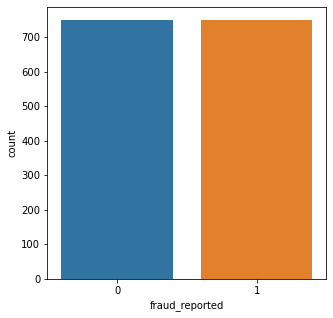

In [101]:
plt.figure(figsize=(5,5))
sns.countplot(y)

#### Now it is balanced

# PCA - Principal Component Analysis

# Model Training And Testing

In [102]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import train_test_split

In [103]:
lr=LogisticRegression()
for i in range(0,800):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=0.20)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    if round(accuracy_score(pred_train,y_train)*100,1)==round(accuracy_score(y_test,pred_test)*100,1):
        print("At random state ",i," The model performs very well")
        print("At random_state:-",i)
        print("Training accuaracy_score is :-",round(accuracy_score(y_train,pred_train)*100,1))
        print("Testing accuracy_score is:-",round(accuracy_score(y_test,pred_test)*100,1),  '\n\n')

At random state  105  The model performs very well
At random_state:- 105
Training accuaracy_score is :- 76.0
Testing accuracy_score is:- 76.0 


At random state  157  The model performs very well
At random_state:- 157
Training accuaracy_score is :- 75.7
Testing accuracy_score is:- 75.7 


At random state  171  The model performs very well
At random_state:- 171
Training accuaracy_score is :- 75.7
Testing accuracy_score is:- 75.7 


At random state  186  The model performs very well
At random_state:- 186
Training accuaracy_score is :- 76.0
Testing accuracy_score is:- 76.0 


At random state  211  The model performs very well
At random_state:- 211
Training accuaracy_score is :- 75.3
Testing accuracy_score is:- 75.3 


At random state  266  The model performs very well
At random_state:- 266
Training accuaracy_score is :- 75.3
Testing accuracy_score is:- 75.3 


At random state  411  The model performs very well
At random_state:- 411
Training accuaracy_score is :- 76.0
Testing accuracy_scor

In [128]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=105)

In [129]:
lr.fit(x_train,y_train)

LogisticRegression()

In [130]:
pred_train=lr.predict(x_train)

In [131]:
pred_test=lr.predict(x_test)

In [132]:
accuracy_score(y_test,pred_test)

0.76

In [133]:
from sklearn.metrics import classification_report

In [134]:
print(classification_report(y_test,pred_test))

              precision    recall  f1-score   support

           0       0.76      0.74      0.75       148
           1       0.76      0.78      0.77       152

    accuracy                           0.76       300
   macro avg       0.76      0.76      0.76       300
weighted avg       0.76      0.76      0.76       300



### CROSS VALIDATION FOR LOGISTICS REGRESSION

In [135]:
pred_lr=lr.predict(x_test)
from sklearn.model_selection import cross_val_score
lss=accuracy_score(y_test,pred_lr)

In [136]:
for i in range(2,10):
    lsscore=cross_val_score(lr,x,y,cv=i)
    lsc=lsscore.mean()
    print ("At cv:-",i)
    print ("Cross validation score is :-",lsc*100)
    print ("Accuracy_score is :-",lss*100)
    print ("\n")

At cv:- 2
Cross validation score is :- 75.13333333333334
Accuracy_score is :- 76.0


At cv:- 3
Cross validation score is :- 73.93333333333332
Accuracy_score is :- 76.0


At cv:- 4
Cross validation score is :- 74.46666666666665
Accuracy_score is :- 76.0


At cv:- 5
Cross validation score is :- 74.93333333333332
Accuracy_score is :- 76.0


At cv:- 6
Cross validation score is :- 75.06666666666668
Accuracy_score is :- 76.0


At cv:- 7
Cross validation score is :- 75.13677150929922
Accuracy_score is :- 76.0


At cv:- 8
Cross validation score is :- 75.00391113892366
Accuracy_score is :- 76.0


At cv:- 9
Cross validation score is :- 74.47274126445903
Accuracy_score is :- 76.0




In [137]:
 # I will take CV as 2 bcz its close to accuracy score
lsscore_selected= cross_val_score(lr,x,y,cv=2).mean()
print ("The cv score is :- ",lsscore_selected,"\nThe accuracy_score is:",lss)

The cv score is :-  0.7513333333333334 
The accuracy_score is: 0.76


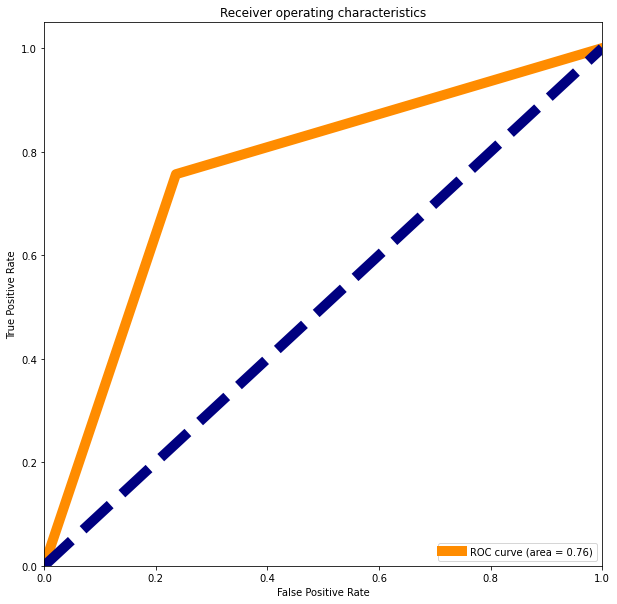

In [138]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

#### Logistic Regression is covering 76% under ROC Curve

# Decision Tree Classifier

In [139]:
# Checking Accuracy for Decision Tree Classifier
dt = DecisionTreeClassifier()
dt.fit(x_train,y_train)

#Prediction
preddt = dt.predict(x_test)

print(accuracy_score(y_test, preddt))
print(confusion_matrix(y_test, preddt))
print(classification_report(y_test,preddt))
print('CV  :-',cross_val_score(dt,x,y,cv=5).mean())

0.8266666666666667
[[118  30]
 [ 22 130]]
              precision    recall  f1-score   support

           0       0.84      0.80      0.82       148
           1       0.81      0.86      0.83       152

    accuracy                           0.83       300
   macro avg       0.83      0.83      0.83       300
weighted avg       0.83      0.83      0.83       300

CV  :- 0.8373333333333333


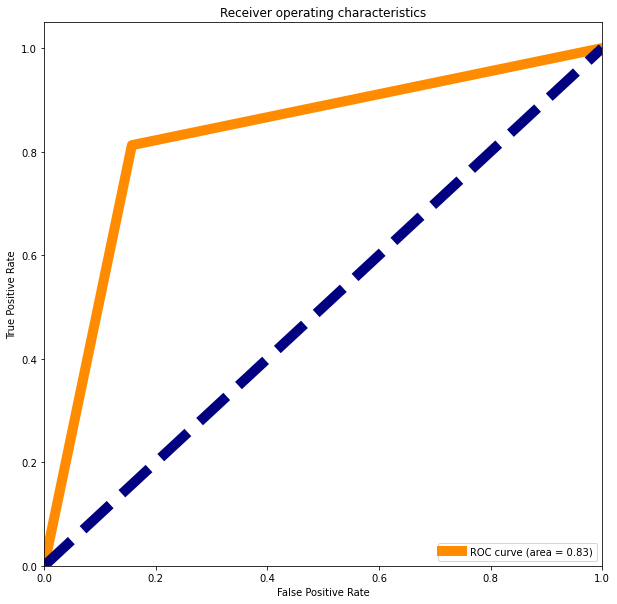

In [140]:
fpr,tpr,threshold=roc_curve(preddt,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

#### Decision ree is covering 83% under Roc Curve

# KNeighbors Classifier

In [141]:
# Checking accuracy for KNeighbors Classifier
knn = KNeighborsClassifier()
knn.fit(x_train,y_train)

# Prediction
predknn = knn.predict(x_test)

print(accuracy_score(y_test, predknn))
print(confusion_matrix(y_test, predknn))
print(classification_report(y_test,predknn))
print('CV  :-',cross_val_score(knn,x,y,cv=5).mean())

0.7033333333333334
[[ 64  84]
 [  5 147]]
              precision    recall  f1-score   support

           0       0.93      0.43      0.59       148
           1       0.64      0.97      0.77       152

    accuracy                           0.70       300
   macro avg       0.78      0.70      0.68       300
weighted avg       0.78      0.70      0.68       300

CV  :- 0.6846666666666665


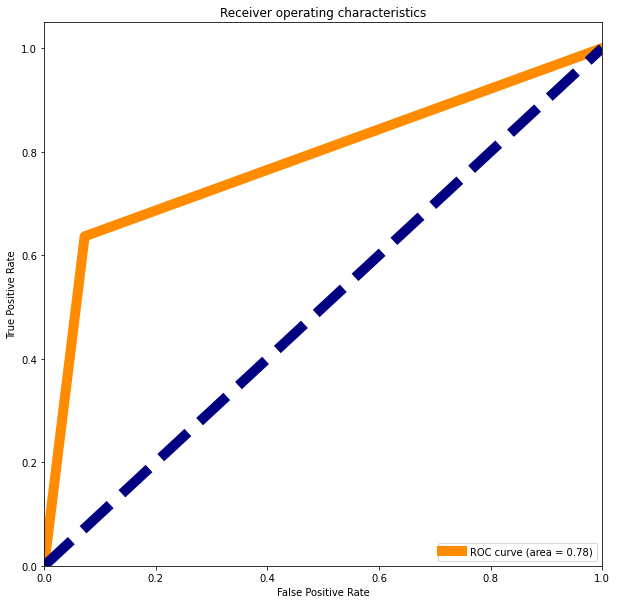

In [142]:
fpr,tpr,threshold=roc_curve(predknn,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

#### KNeighbors is covering 78% under ROC Crrve

# Ensemble  Technique

In [143]:
# Checking accuracy for Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(x_train,y_train)

# Prediction
predrf = rf.predict(x_test)

print(accuracy_score(y_test, predrf))
print(confusion_matrix(y_test, predrf))
print(classification_report(y_test,predrf))
print('CV  :-',cross_val_score(rf,x,y,cv=5).mean())

0.85
[[126  22]
 [ 23 129]]
              precision    recall  f1-score   support

           0       0.85      0.85      0.85       148
           1       0.85      0.85      0.85       152

    accuracy                           0.85       300
   macro avg       0.85      0.85      0.85       300
weighted avg       0.85      0.85      0.85       300

CV  :- 0.8793333333333333


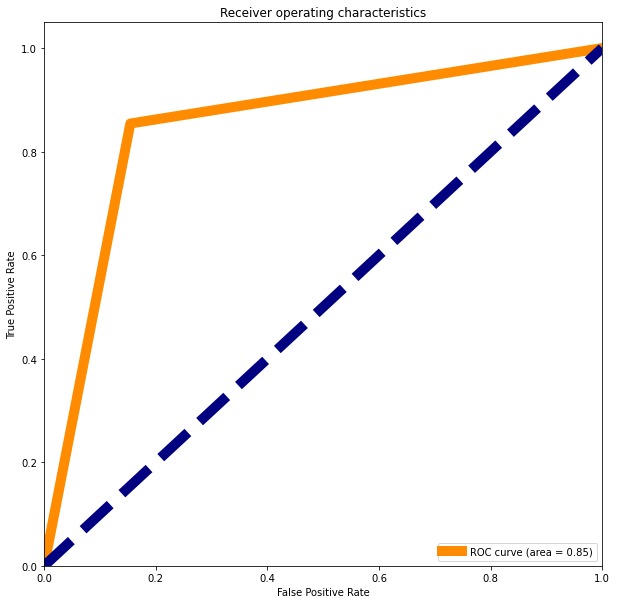

In [144]:
fpr,tpr,threshold=roc_curve(predrf,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

#### Random Forest is covering 85% under ROC curve

In [159]:
# Checking accuracy for Gradient Boosting Classifier
gb = GradientBoostingClassifier()
gb.fit(x_train,y_train)

# Prediction
predgb = gb.predict(x_test)

print(accuracy_score(y_test, predgb))
print(confusion_matrix(y_test, predgb))
print(classification_report(y_test,predgb))

print('CV  :-',cross_val_score(gb,x,y,cv=5).mean())

0.8733333333333333
[[126  22]
 [ 16 136]]
              precision    recall  f1-score   support

           0       0.89      0.85      0.87       148
           1       0.86      0.89      0.88       152

    accuracy                           0.87       300
   macro avg       0.87      0.87      0.87       300
weighted avg       0.87      0.87      0.87       300

CV  :- 0.8826666666666668


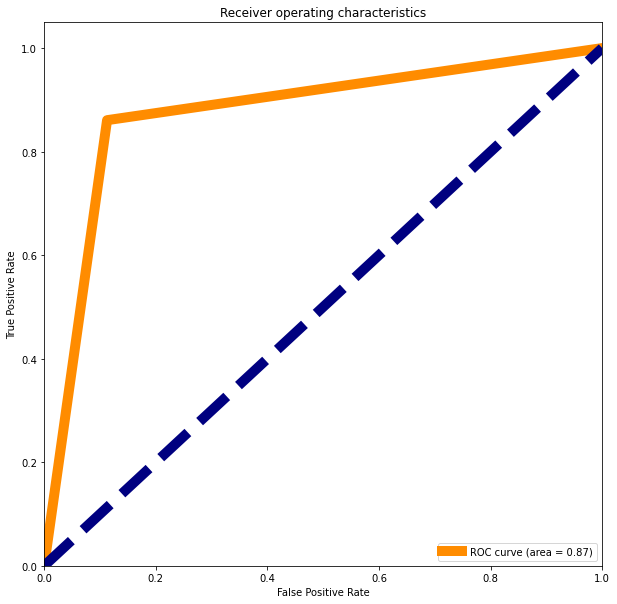

In [160]:
fpr,tpr,threshold=roc_curve(predgb,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

#### Gradient boosting classifier is covering 87% under roc curve

In [166]:
from sklearn.ensemble import ExtraTreesClassifier

# Checking accuracy for Gradient Boosting Classifier
et = ExtraTreesClassifier()
et.fit(x_train,y_train)

# Prediction
predet = et.predict(x_test)

print(accuracy_score(y_test, predet))
print(confusion_matrix(y_test, predet))
print(classification_report(y_test,predet))

print('CV  :-',cross_val_score(et,x,y,cv=5).mean())


0.87
[[130  18]
 [ 21 131]]
              precision    recall  f1-score   support

           0       0.86      0.88      0.87       148
           1       0.88      0.86      0.87       152

    accuracy                           0.87       300
   macro avg       0.87      0.87      0.87       300
weighted avg       0.87      0.87      0.87       300

CV  :- 0.9099999999999999


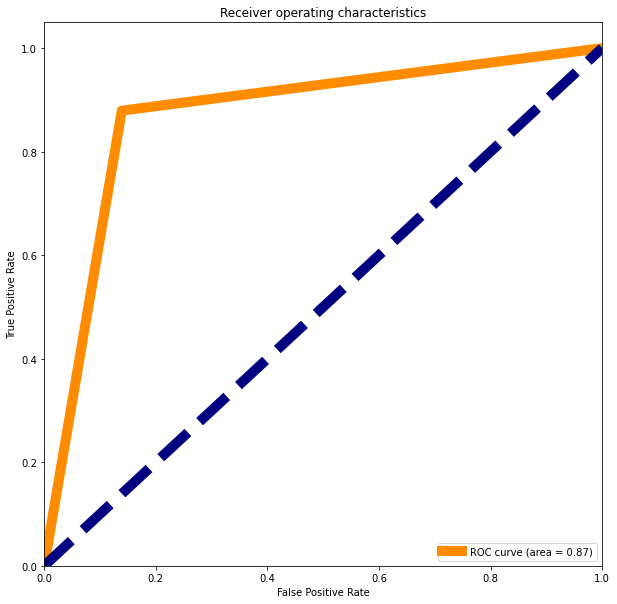

In [167]:
fpr,tpr,threshold=roc_curve(predet,y_test)
roc_auc=auc(fpr,tpr)

plt.figure(figsize=(10,10))
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' %roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristics')
plt.legend(loc="lower right")
plt.show()

#### Extra tree classifier covers 87% under ROC CUrve

# Plotting ROC and compare AUC for all the models used

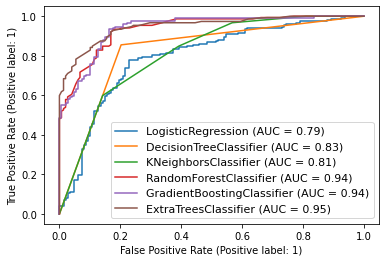

In [168]:
# Plotting for all the models used here
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 


disp=plot_roc_curve(lr, x_test, y_test)   
plot_roc_curve(dt, x_test, y_test, ax=disp.ax_)
plot_roc_curve(knn, x_test, y_test, ax=disp.ax_)
plot_roc_curve(rf, x_test, y_test, ax=disp.ax_)
plot_roc_curve(gb, x_test, y_test, ax=disp.ax_)
plot_roc_curve(et, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

# Making a dataframe of all the models accuracy score

In [169]:
mm=pd.DataFrame([["LR","76%"],["Decision Tree Classifier","82%"],["KNeighbors Classifier","78%"],["Random Forest Classifier","85%"],["Gradient Boosting","87%"],["Extra Tree Classifier","87%"]],
                    columns=["Model_Name","AccuracyScore"])

mm

,Model_Name,AccuracyScore
0,LR,76%
1,Decision Tree Classifier,82%
2,KNeighbors Classifier,78%
3,Random Forest Classifier,85%
4,Gradient Boosting,87%
5,Extra Tree Classifier,87%


#### Selecting Extra Tree classifier for Hyoerparameter Tuning as there is very less difference between accuracy score and cross validation.. and has best accuracy score in all models

# Hyperparameter Tuning

In [170]:
from sklearn.model_selection import GridSearchCV

In [171]:
et.get_params()

{'bootstrap': False,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [172]:
#Extra Tree Classifier
parameters = {'criterion' : ['gini','entropy'],
              'random_state' : [10, 50, 100],
              'max_depth' : [0, 10, 20],
              'oob_score': [False,True],
              'warm_start' : [True,False]}


In [173]:
qq=GridSearchCV(ExtraTreesClassifier(),parameters,cv=5)

In [174]:
qq.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20], 'oob_score': [False, True],
                         'random_state': [10, 50, 100],
                         'warm_start': [True, False]})

In [175]:
qq.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'oob_score': False,
 'random_state': 100,
 'warm_start': True}

In [176]:
et = ExtraTreesClassifier(criterion ='gini',max_depth=20, oob_score=False,warm_start=True,random_state=100)
et.fit(x_train, y_train)
pred = et.predict(x_test)
print('Accuracy_Score :-> ',accuracy_score(y_test,pred)*100)

Accuracy_Score :->  86.33333333333333


# Saving the Model

In [177]:
#Saving the model using .pkl
import joblib
joblib.dump(et,"ICFD_class.pkl")

['ICFD_class.pkl']

In [178]:
#Loading the saved model
aa=joblib.load("ICFD_class.pkl")

# Conclusion

In [179]:
#Prediction
prediction = aa.predict(x_test)
prediction

array([1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0,
       0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0,
       0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1,
       1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1,
       0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0,
       1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1,
       0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0,
       1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0,
       1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1])

In [180]:
pd.DataFrame([aa.predict(x_test)[:],y_test[:]],index=["Predicted","Original"]).T

,Predicted,Original
0,1,1
1,0,0
2,1,1
3,1,1
4,0,0
...,...,...
295,0,0
296,1,1
297,0,1
298,1,1


# Project completes here...

# -------------------------------------------------------------